In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv('political_tweets.csv',delimiter='|')
df.head()

,Unnamed: 0,last_updated,tweet_id,created_at,user_location,full_text,quote_count,reply_count,retweet_count,favorite_count,...,Pos_VERB_count,Neg_VERB_count,Pos_ADV_count,Neg_ADV_count,neg,neu,pos,compound,weighted_compound,weighted_compound_new
0,0,2019-03-06T17:30:21.000+05:30,1.103136e+18,2019-03-06T03:33:25.000+05:30,Guwahati,Guwahati has gained a lot of prominence in rec...,0,4.0,113.0,113.0,...,0.0,0.0,0.0,0.0,0.000,0.880,0.120,0.6486,73.2918,0.000911
1,1,2019-03-17T18:11:58.000+05:30,1.107333e+18,2019-03-17T17:27:57.000+05:30,NaN,RSS in school days itself? Indoctrinated since...,0,0.0,5.0,5.0,...,0.0,0.0,0.0,0.0,0.332,0.579,0.088,-0.7906,-3.9530,-0.000303
2,2,2019-03-23T18:07:38.000+05:30,1.109417e+18,2019-03-23T11:28:31.000+05:30,New Delhi,Words don't exist in Vaccum!\nModi's post Pulw...,0,4.0,31.0,31.0,...,0.0,0.0,0.0,0.0,0.130,0.870,0.000,-0.6900,-21.3900,-0.000577
3,3,2019-03-11T17:47:32.000+05:30,1.100300e+18,2019-02-26T07:40:28.000+05:30,NaN,"India's #Icecream Industry stands at 15,000 cr...",0,0.0,3.0,3.0,...,0.0,0.0,0.0,0.0,0.000,0.955,0.045,0.1779,0.5337,-0.000232
4,4,2019-02-27T18:18:42.000+05:30,1.100733e+18,2019-02-27T12:21:18.000+05:30,Delhi | Odisha,*40 CRPF Jawans killed in Pulwama Attack\n*IAF...,0,0.0,9.0,9.0,...,0.0,0.0,0.0,0.0,0.362,0.638,0.000,-0.9638,-8.6742,-0.000377


In [3]:
df['full_text'][0]

"Guwahati has gained a lot of prominence in recent years due to PM Shri @narendramodi ji's #ActEast Policy. \n\nThe infrastructural upgrades undertaken will go a long way in establishing Guwahati as one of India's smart cities and as gateway to @ASEAN countries: CM"

In [4]:
df.shape

(46043, 44)

In [5]:
df.isnull().sum()

Unnamed: 0                       0
last_updated                     0
tweet_id                         2
created_at                       2
user_location                 5779
full_text                        2
quote_count                   1402
reply_count                   1410
retweet_count                    7
favorite_count                   0
hashtags                     36836
user_mentions_screen_name    28320
OfImportance                     7
subject                          7
ADJ                              7
NOUN                             7
VERB                             7
ADV                              7
Pos_ADJ                          7
Neg_ADJ                          7
Pos_NOUN                         7
Neg_NOUN                         7
Pos_VERB                         8
Neg_VERB                         8
Pos_ADV                         12
Neg_ADV                          8
City                         30330
State                        28788
District            

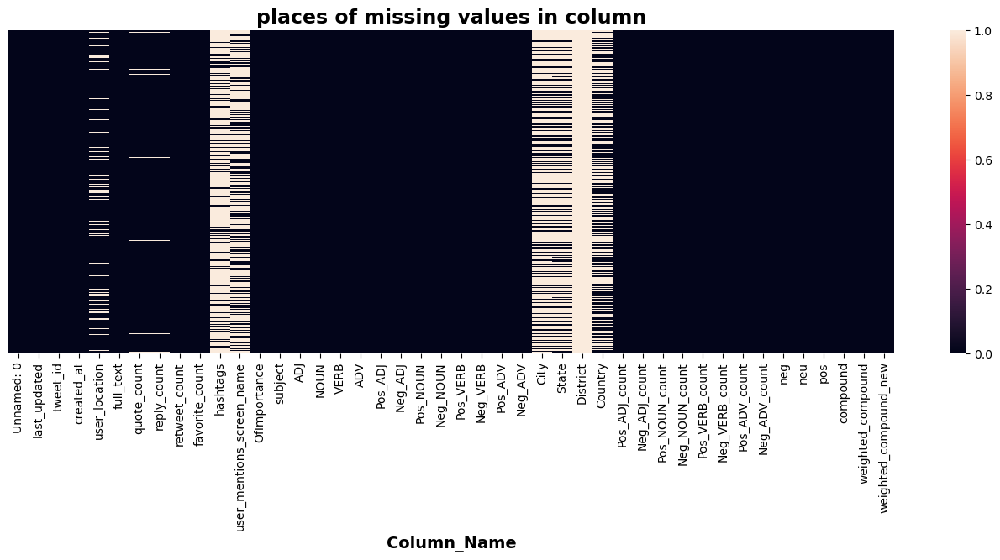

In [6]:
plt.figure(figsize=(17,5))
sns.heatmap(df.isnull(),cbar=True,yticklabels=False)
plt.xlabel("Column_Name",size=14,weight="bold")
plt.title("places of missing values in column",fontweight="bold",size=17)
plt.show()

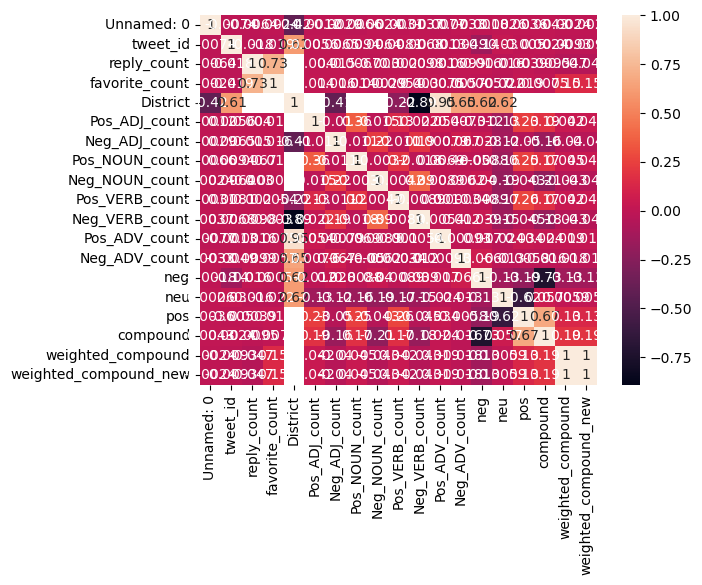

In [7]:
corrmatrix=df.corr()
sns.heatmap(corrmatrix,annot=True)
plt.show()

In [8]:
df['hashtags']

0                                             ActEast
1                                                 NaN
2                                                 NaN
3                                            Icecream
4                                                 NaN
                             ...                     
46038                                             NaN
46039    Noida,homebuyers,AntrikshSanskriti,Ghaziabad
46040                                             NaN
46041                                             NaN
46042                                  VaranasiDebate
Name: hashtags, Length: 46043, dtype: object

In [9]:
df['hashtags']=df[['hashtags']].fillna('')
df['user_location']=df[['user_location']].fillna('')
df['full_text']=df[['full_text']].fillna('')
df['subject']=df[['subject']].fillna('')

In [10]:
df.isnull().sum()

Unnamed: 0                       0
last_updated                     0
tweet_id                         2
created_at                       2
user_location                    0
full_text                        0
quote_count                   1402
reply_count                   1410
retweet_count                    7
favorite_count                   0
hashtags                         0
user_mentions_screen_name    28320
OfImportance                     7
subject                          0
ADJ                              7
NOUN                             7
VERB                             7
ADV                              7
Pos_ADJ                          7
Neg_ADJ                          7
Pos_NOUN                         7
Neg_NOUN                         7
Pos_VERB                         8
Neg_VERB                         8
Pos_ADV                         12
Neg_ADV                          8
City                         30330
State                        28788
District            

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46043 entries, 0 to 46042
Data columns (total 44 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Unnamed: 0                 46043 non-null  int64  
 1   last_updated               46043 non-null  object 
 2   tweet_id                   46041 non-null  float64
 3   created_at                 46041 non-null  object 
 4   user_location              46043 non-null  object 
 5   full_text                  46043 non-null  object 
 6   quote_count                44641 non-null  object 
 7   reply_count                44633 non-null  float64
 8   retweet_count              46036 non-null  object 
 9   favorite_count             46043 non-null  float64
 10  hashtags                   46043 non-null  object 
 11  user_mentions_screen_name  17723 non-null  object 
 12  OfImportance               46036 non-null  object 
 13  subject                    46043 non-null  obj

In [12]:
df=df[['user_location','full_text','subject','hashtags']]
df.head()

,user_location,full_text,subject,hashtags
0,Guwahati,Guwahati has gained a lot of prominence in rec...,Bjp,ActEast
1,,RSS in school days itself? Indoctrinated since...,Bjp,
2,New Delhi,Words don't exist in Vaccum!\nModi's post Pulw...,Bjp,
3,,"India's #Icecream Industry stands at 15,000 cr...",Congress,Icecream
4,Delhi | Odisha,*40 CRPF Jawans killed in Pulwama Attack\n*IAF...,Bjp,


In [13]:
df.subject.unique()

array(['Bjp', 'Congress', 'Others', '', '[]', "['not', 'instead']",
       "['govt']", "['now']"], dtype=object)

In [32]:
bjp_election=df[df.subject=='Bjp']
bjp_election.head()

,user_location,full_text,subject,hashtags
0,Guwahati,Guwahati has gained a lot of prominence in rec...,Bjp,ActEast
1,,RSS in school days itself? Indoctrinated since...,Bjp,
2,New Delhi,Words don't exist in Vaccum!\nModi's post Pulw...,Bjp,
4,Delhi | Odisha,*40 CRPF Jawans killed in Pulwama Attack\n*IAF...,Bjp,
5,New Delhi,"In Andhra, Mr. CM @ncbn gave minority to a Mus...",Bjp,


In [33]:
congress_election=df[df.subject=='Congress']
congress_election.head()

,user_location,full_text,subject,hashtags
3,,"India's #Icecream Industry stands at 15,000 cr...",Congress,Icecream
7,,A multitude of supporters from across the leng...,Congress,
8,New Delhi,PAPPU's lawyer to reply court latest by10.30 a...,Congress,
9,https://wwwfacebookcom/blackeyepolitics/,Ilhan Omar has made a name for herself as one ...,Congress,
12,Odisha,Odisha is blessed with so many rivers but stil...,Congress,


In [14]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [15]:
import nltk
import re
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [16]:
stemmer=nltk.SnowballStemmer("english")
from nltk.corpus import stopwords
import string
stopwords=set(stopwords.words('english'))

In [17]:
def clean(text):
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = [word for word in text.split(' ') if word not in stopwords]
    text=" ".join(text)
    text = [stemmer.stem(word) for word in text.split(' ')]
    text=" ".join(text)
    return text
df["full_text"] = df["full_text"].apply(clean)


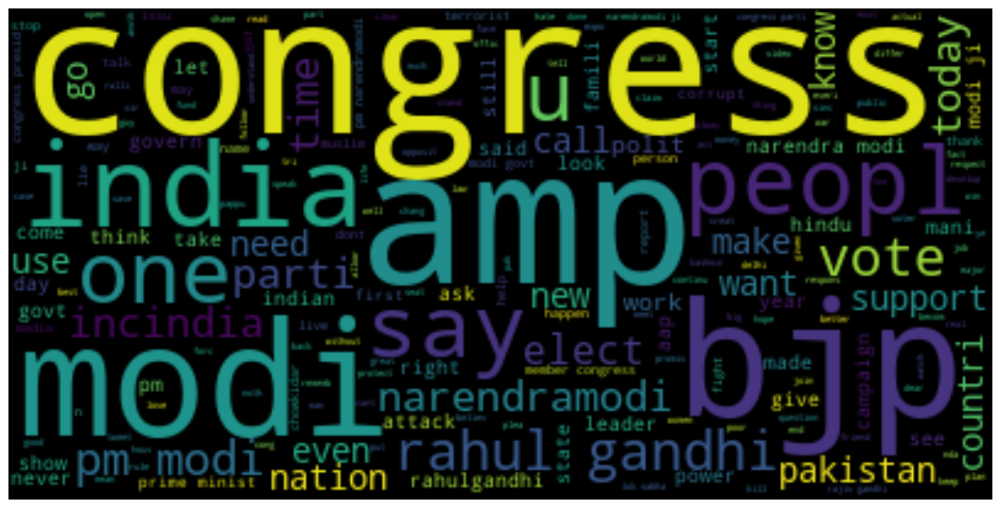

In [18]:
text = " ".join(i for i in df.full_text)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

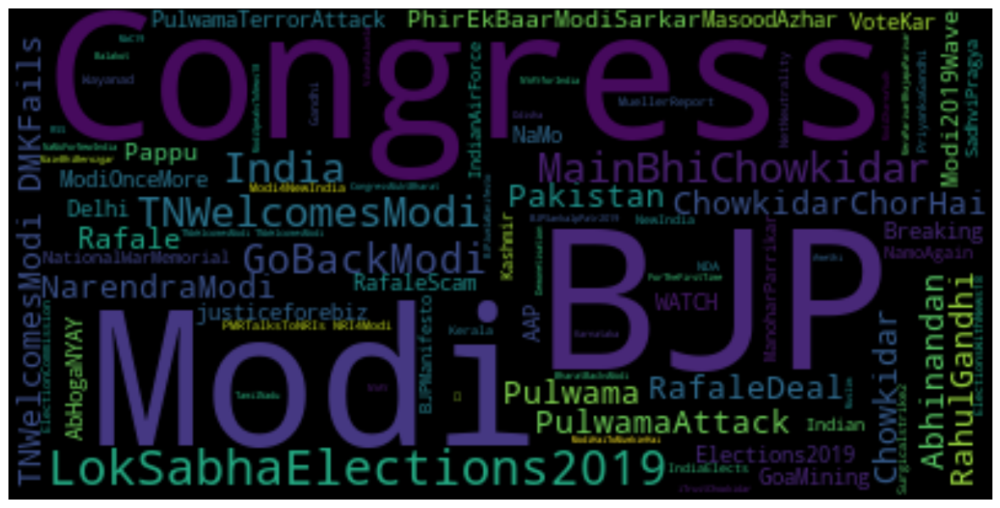

In [19]:
import string
text = " ".join(str(i) for i in df.hashtags)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [20]:
import string
text = " ".join(str(i) for i in bjp_election.hashtags)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

NameError: name 'bjp_election' is not defined

In [ ]:
import string
text = " ".join(str(i) for i in congress_election.hashtags)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
bjp_election["full_text"]=bjp_election["full_text"].apply(clean)
congress_election["full_text"]=congress_election["full_text"].apply(clean)

import string
text = " ".join(str(i) for i in bjp_election.full_text)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

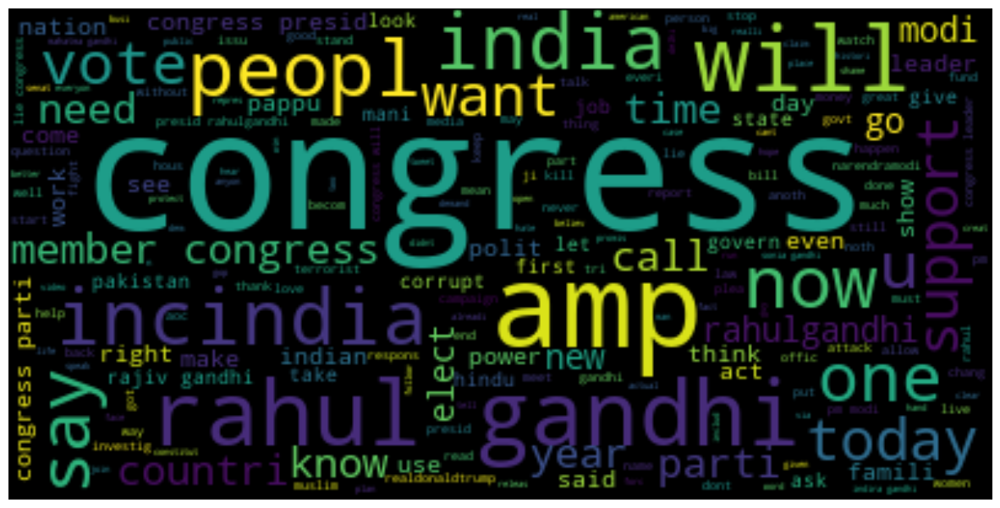

In [27]:
import string
text = " ".join(str(i) for i in congress_election.full_text)
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [21]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [39]:
bjp_election['sentiment'] = bjp_election['full_text'].apply(lambda x: sid.polarity_scores(x))
congress_election['sentiment'] = congress_election['full_text'].apply(lambda x: sid.polarity_scores(x))

def sentimentVerdict(sentiment):
  if sentiment['compound'] >= 0.05:
    return "Positive"
  elif sentiment['compound'] <= -0.05:
    return "Negative"
  else:
    return "Neutral"

bjp_election['sentiment_overall'] = bjp_election['sentiment'].apply(lambda x: sentimentVerdict(x))
congress_election['sentiment_overall'] = congress_election['sentiment'].apply(lambda x: sentimentVerdict(x))


In [40]:
bjp_election.head()

,user_location,full_text,subject,hashtags,sentiment,sentiment_overall
0,Guwahati,Guwahati has gained a lot of prominence in rec...,Bjp,ActEast,"{'neg': 0.0, 'neu': 0.88, 'pos': 0.12, 'compou...",Positive
1,,RSS in school days itself? Indoctrinated since...,Bjp,,"{'neg': 0.332, 'neu': 0.579, 'pos': 0.088, 'co...",Negative
2,New Delhi,Words don't exist in Vaccum!\nModi's post Pulw...,Bjp,,"{'neg': 0.13, 'neu': 0.87, 'pos': 0.0, 'compou...",Negative
4,Delhi | Odisha,*40 CRPF Jawans killed in Pulwama Attack\n*IAF...,Bjp,,"{'neg': 0.362, 'neu': 0.638, 'pos': 0.0, 'comp...",Negative
5,New Delhi,"In Andhra, Mr. CM @ncbn gave minority to a Mus...",Bjp,,"{'neg': 0.0, 'neu': 0.876, 'pos': 0.124, 'comp...",Positive


In [41]:
congress_election.head()

,user_location,full_text,subject,hashtags,sentiment,sentiment_overall
3,,"India's #Icecream Industry stands at 15,000 cr...",Congress,Icecream,"{'neg': 0.0, 'neu': 0.955, 'pos': 0.045, 'comp...",Positive
7,,A multitude of supporters from across the leng...,Congress,,"{'neg': 0.0, 'neu': 0.884, 'pos': 0.116, 'comp...",Positive
8,New Delhi,PAPPU's lawyer to reply court latest by10.30 a...,Congress,,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
9,https://wwwfacebookcom/blackeyepolitics/,Ilhan Omar has made a name for herself as one ...,Congress,,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
12,Odisha,Odisha is blessed with so many rivers but stil...,Congress,,"{'neg': 0.061, 'neu': 0.688, 'pos': 0.251, 'co...",Positive


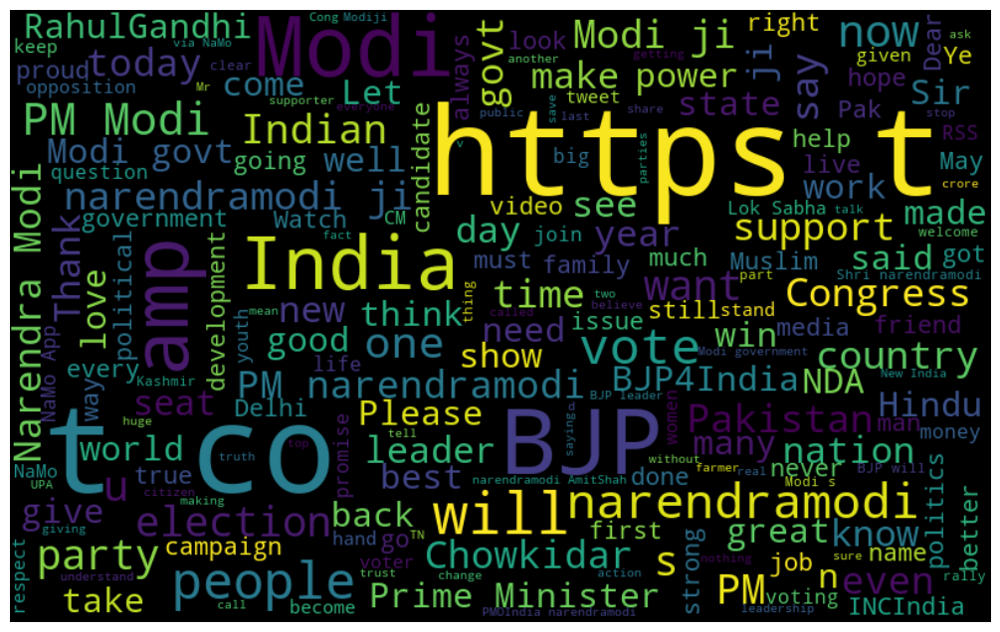

In [42]:
all_words=" ".join([sentence for sentence in bjp_election['full_text'][bjp_election['sentiment_overall']=='Positive']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

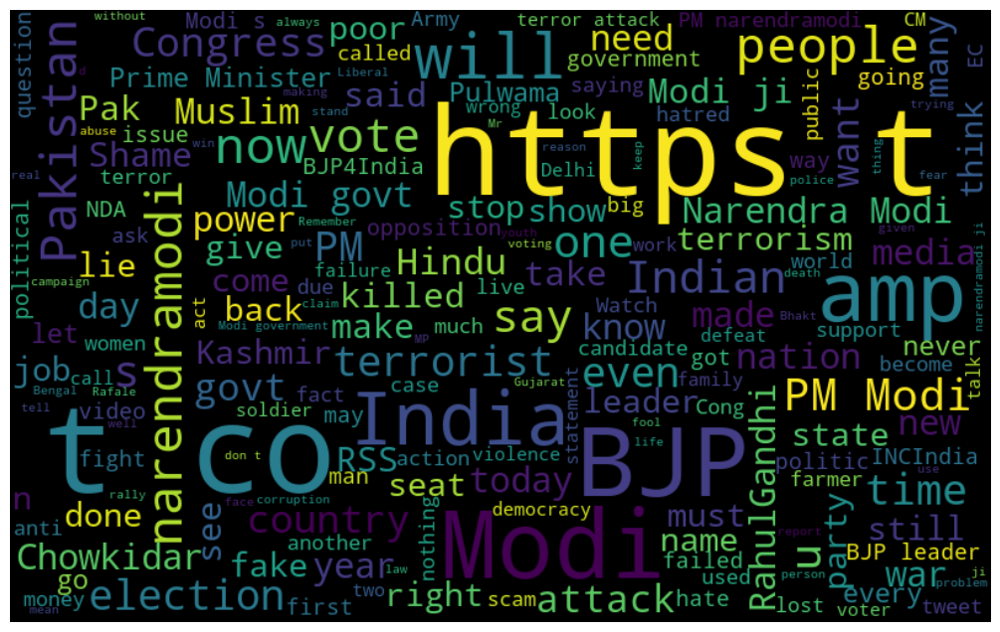

In [43]:
all_words=" ".join([sentence for sentence in bjp_election['full_text'][bjp_election['sentiment_overall']=='Negative']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

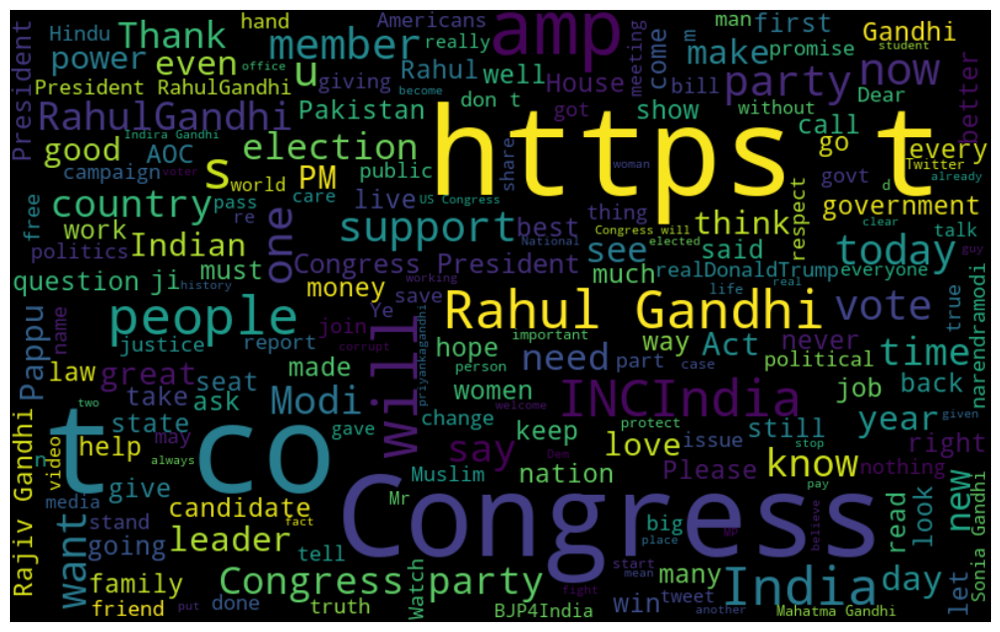

In [44]:
all_words=" ".join([sentence for sentence in congress_election['full_text'][congress_election['sentiment_overall']=='Positive']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

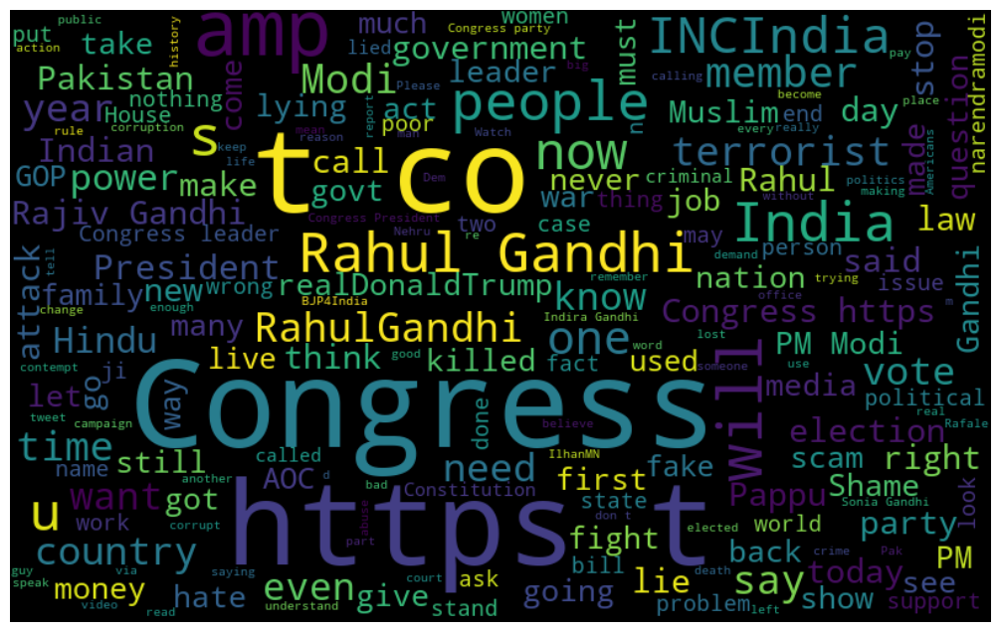

In [45]:
all_words=" ".join([sentence for sentence in congress_election['full_text'][congress_election['sentiment_overall']=='Negative']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

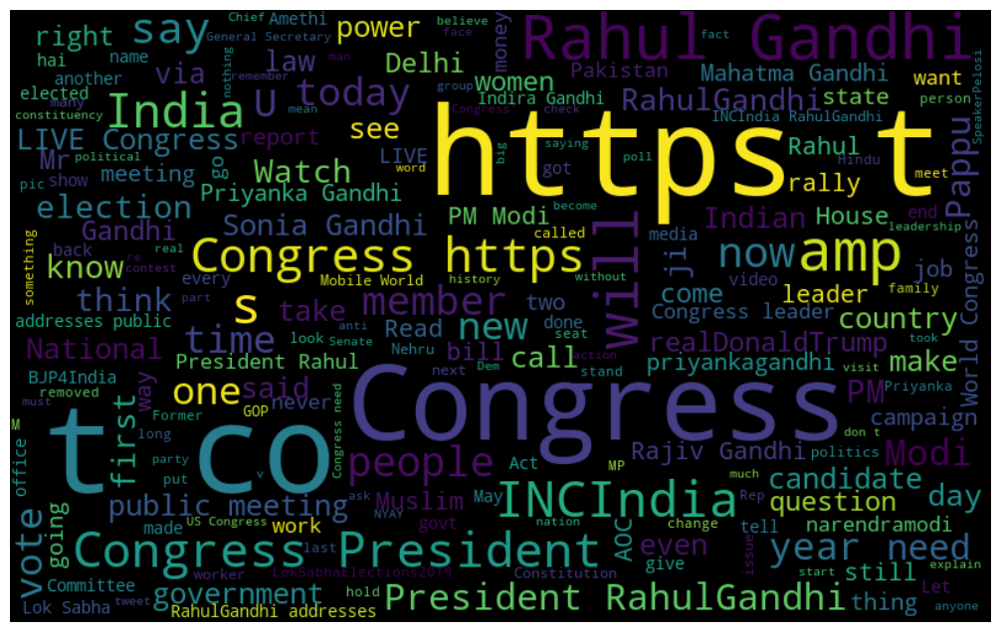

In [46]:
all_words=" ".join([sentence for sentence in congress_election['full_text'][congress_election['sentiment_overall']=='Neutral']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

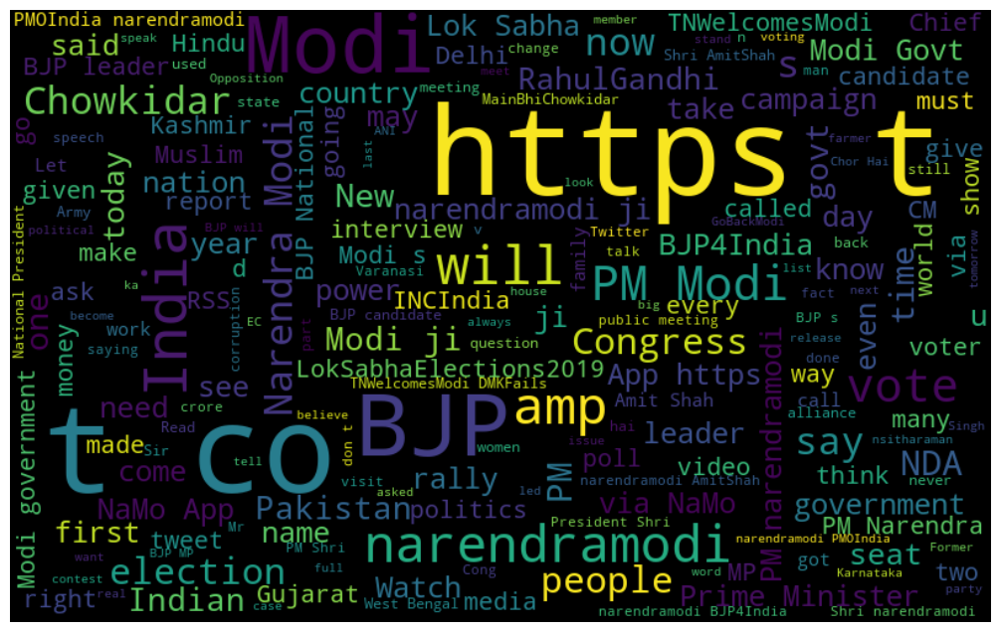

In [47]:
all_words=" ".join([sentence for sentence in bjp_election['full_text'][bjp_election['sentiment_overall']=='Neutral']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

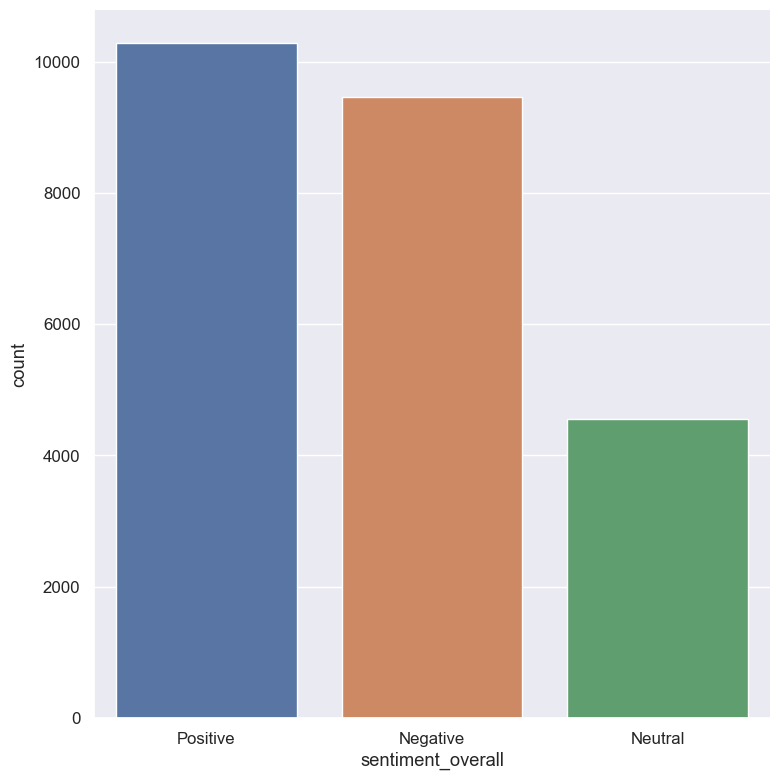

In [48]:
sns.set(font_scale=1.1)
sns.catplot("sentiment_overall", data=bjp_election, kind="count", height=8)

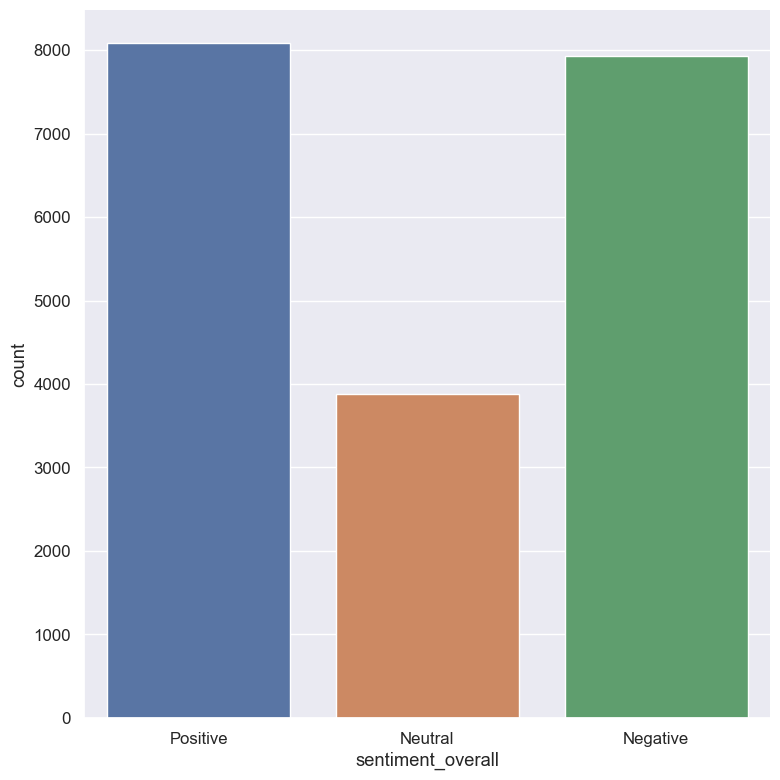

In [49]:
sns.set(font_scale=1.1)
sns.catplot("sentiment_overall", data=congress_election, kind="count", height=8)

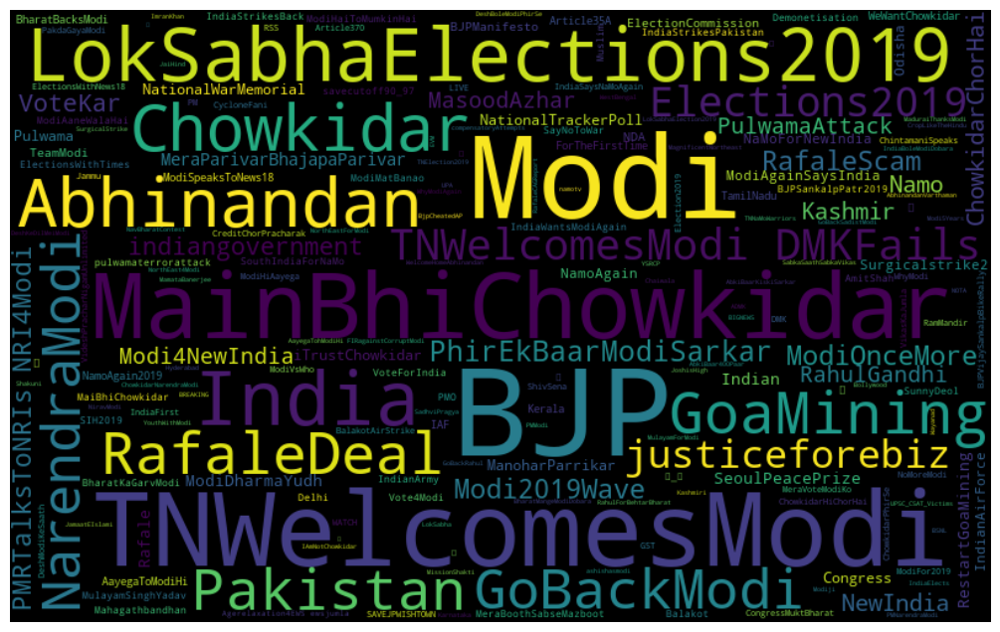

In [40]:
all_words=" ".join([sentence for sentence in bjp_election['hashtags'][bjp_election['sentiment_overall']=='Positive']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

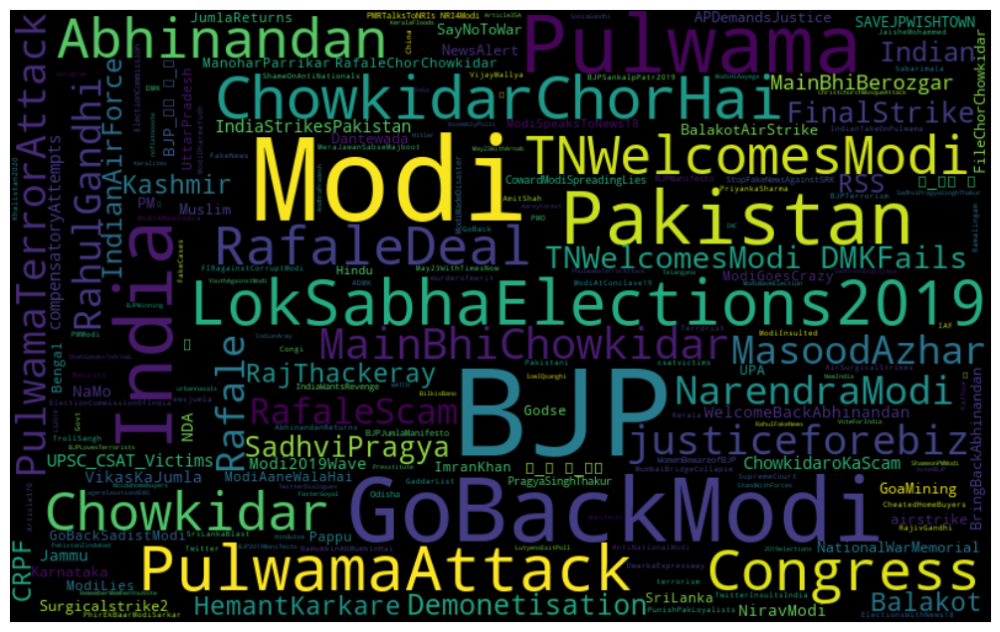

In [41]:
all_words=" ".join([sentence for sentence in bjp_election['hashtags'][bjp_election['sentiment_overall']=='Negative']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

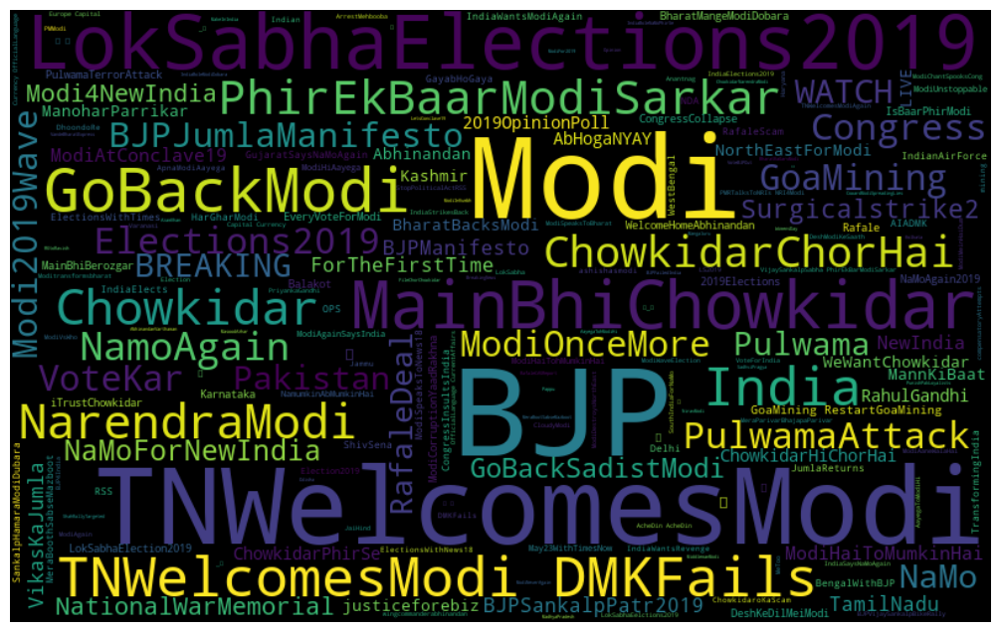

In [42]:
all_words=" ".join([sentence for sentence in bjp_election['hashtags'][bjp_election['sentiment_overall']=='Neutral']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

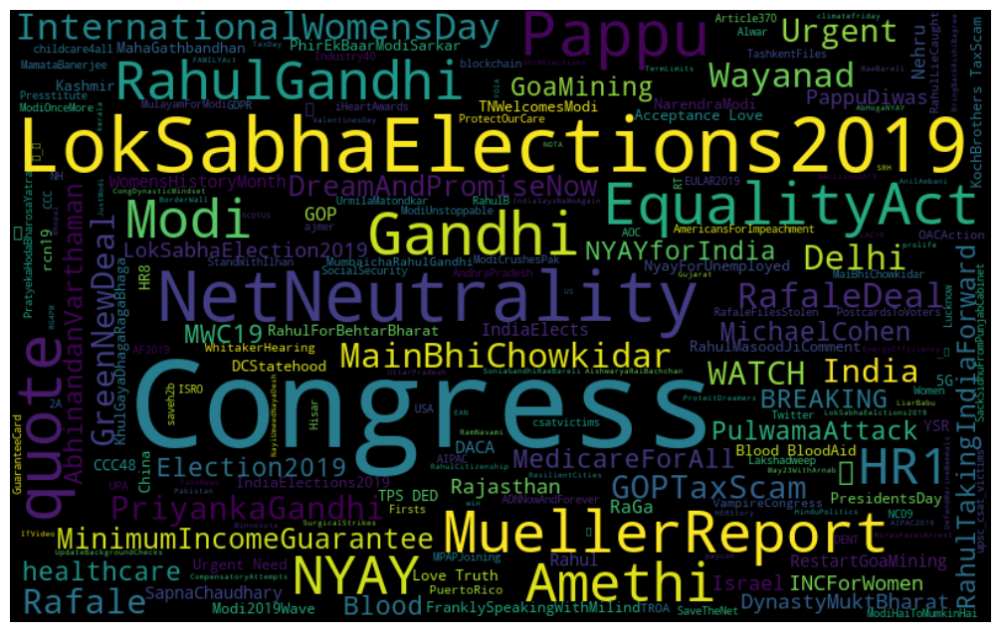

In [43]:
all_words=" ".join([sentence for sentence in congress_election['hashtags'][congress_election['sentiment_overall']=='Positive']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

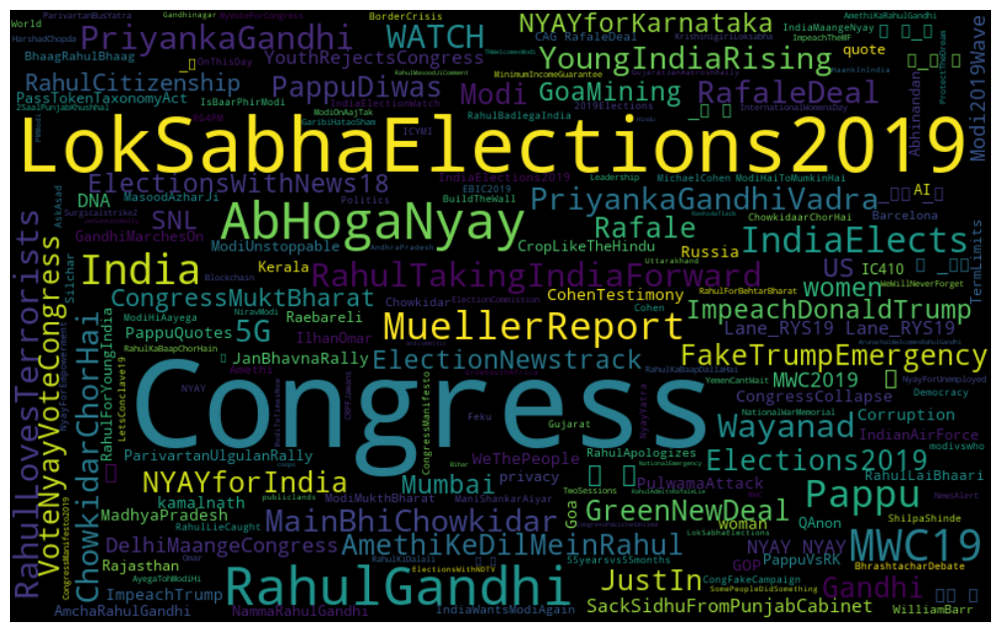

In [44]:
all_words=" ".join([sentence for sentence in congress_election['hashtags'][congress_election['sentiment_overall']=='Neutral']])

from wordcloud import WordCloud
wordcloud=WordCloud(width=800,height=500,random_state=21,max_font_size=100).generate(all_words)

#plot the graph
plt.figure(figsize=(15,8))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()

In [45]:
new_bjp=bjp_election[['full_text','sentiment_overall']]
new_bjp.head()

,full_text,sentiment_overall
0,guwahati gain lot promin recent year due pm sh...,Positive
1,rss school day indoctrin childhood thrice ban ...,Negative
2,word dont exist vaccummodi post pulwama word g...,Negative
4,crpf jawan kill pulwama attackiaf strike paki...,Negative
5,andhra mr cm ncbn gave minor muslim politician...,Positive


In [46]:
from sklearn.feature_extraction.text import CountVectorizer
bow_vectorizer=CountVectorizer(max_df=0.9,min_df=2,max_features=1000,stop_words=stopwords)
bow=bow_vectorizer.fit_transform(new_bjp['full_text'])

In [47]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(bow,new_bjp['sentiment_overall'],random_state=42,stratify=new_bjp['sentiment_overall'])

In [48]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(18219, 1000)
(6074, 1000)
(18219,)
(6074,)


training accuracy Score    :  0.7433997475163291
Validation accuracy Score :  0.7113928218636812
              precision    recall  f1-score   support

    Negative       0.73      0.72      0.73      2187
     Neutral       0.66      0.67      0.67      1643
    Positive       0.73      0.73      0.73      2244

    accuracy                           0.71      6074
   macro avg       0.71      0.71      0.71      6074
weighted avg       0.71      0.71      0.71      6074



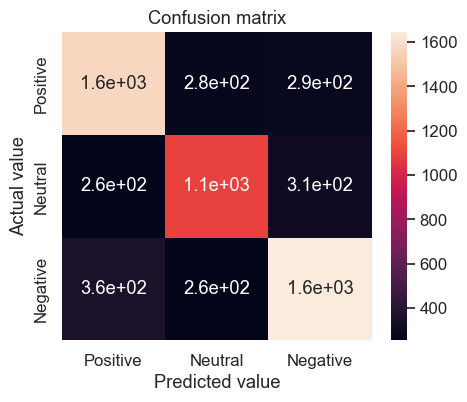

In [49]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score
from sklearn import metrics 
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
naiveByes_clf = MultinomialNB()

naiveByes_clf.fit(x_train,y_train)
NB_prediction=naiveByes_clf.predict(x_test)
NB_accuracy=accuracy_score(NB_prediction,y_test)
print("training accuracy Score    : ",naiveByes_clf.score(x_train,y_train))
print("Validation accuracy Score : ",NB_accuracy )
print(classification_report(NB_prediction,y_test))

result=confusion_matrix(y_test,NB_prediction)
result_df=pd.DataFrame(result,index=['Positive','Neutral','Negative'],columns=['Positive','Neutral','Negative'])

plt.figure(figsize=(5,4))
sns.heatmap(result_df,annot=True)
plt.title('Confusion matrix')
plt.ylabel('Actual value')
plt.xlabel('Predicted value')
plt.show()


Training accuracy Score    :  0.8421977056918601
Validation accuracy Score :  0.8294369443529799
              precision    recall  f1-score   support

    Negative       0.76      0.88      0.82      1851
     Neutral       0.92      0.74      0.82      2092
    Positive       0.82      0.87      0.85      2131

    accuracy                           0.83      6074
   macro avg       0.84      0.83      0.83      6074
weighted avg       0.84      0.83      0.83      6074



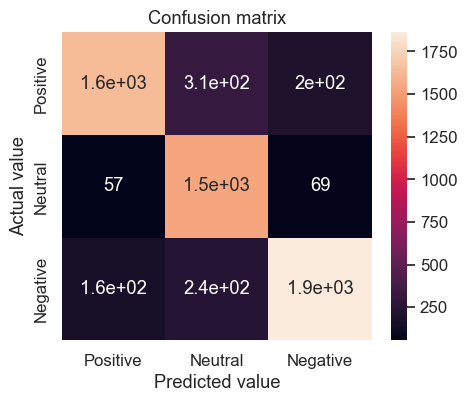

In [50]:
from sklearn.linear_model import SGDClassifier

sgd_clf = SGDClassifier(loss = 'hinge', penalty = 'l2', random_state=42)

sgd_clf.fit(x_train,y_train)

sgd_prediction = sgd_clf.predict(x_test)
sgd_accuracy = accuracy_score(y_test,sgd_prediction)
print("Training accuracy Score    : ",sgd_clf.score(x_train,y_train))
print("Validation accuracy Score : ",sgd_accuracy )
print(classification_report(sgd_prediction,y_test))

result=confusion_matrix(y_test,sgd_prediction)
result_df=pd.DataFrame(result,index=['Positive','Neutral','Negative'],columns=['Positive','Neutral','Negative'])

plt.figure(figsize=(5,4))
sns.heatmap(result_df,annot=True)
plt.title('Confusion matrix')
plt.ylabel('Actual value')
plt.xlabel('Predicted value')
plt.show()

Training accuracy Score    :  0.9984631428728251
Validation accuracy Score :  0.7994731643068818
              precision    recall  f1-score   support

    Negative       0.73      0.82      0.77      1928
     Neutral       0.88      0.75      0.81      1974
    Positive       0.80      0.83      0.82      2172

    accuracy                           0.80      6074
   macro avg       0.81      0.80      0.80      6074
weighted avg       0.81      0.80      0.80      6074



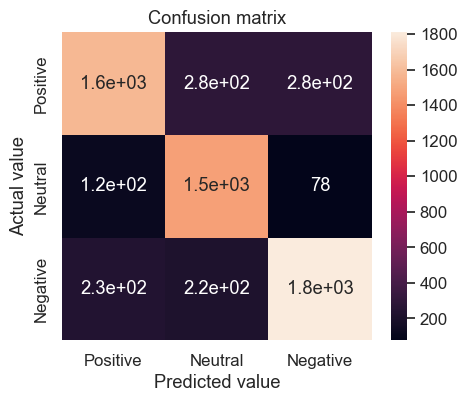

In [51]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier()

rf_clf.fit(x_train,y_train)

rf_prediction = rf_clf.predict(x_test)
rf_accuracy = accuracy_score(y_test,rf_prediction)
print("Training accuracy Score    : ",rf_clf.score(x_train,y_train))
print("Validation accuracy Score : ",rf_accuracy )
print(classification_report(rf_prediction,y_test))

result=confusion_matrix(y_test,rf_prediction)
result_df=pd.DataFrame(result,index=['Positive','Neutral','Negative'],columns=['Positive','Neutral','Negative'])

plt.figure(figsize=(5,4))
sns.heatmap(result_df,annot=True)
plt.title('Confusion matrix')
plt.ylabel('Actual value')
plt.xlabel('Predicted value')
plt.show()

[18:20:21] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Training accuracy Score    :  0.8579504912454031
Validation accuracy Score :  0.8187355943365163
              precision    recall  f1-score   support

    Negative       0.74      0.87      0.80      1806
     Neutral       0.94      0.73      0.82      2161
    Positive       0.81      0.86      0.83      2107

    accuracy                           0.82      6074
   macro avg       0.83      0.82      0.82      6074
weighted avg       0.83      0.82      0.82      6074



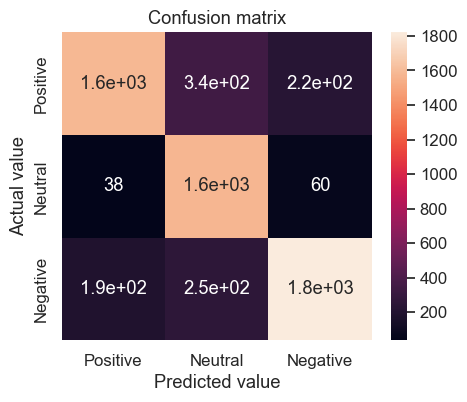

In [52]:
import xgboost as xgb

xgboost_clf = xgb.XGBClassifier()

xgboost_clf.fit(x_train, y_train)

xgb_prediction = xgboost_clf.predict(x_test)
xgb_accuracy = accuracy_score(y_test,xgb_prediction)
print("Training accuracy Score    : ",xgboost_clf.score(x_train,y_train))
print("Validation accuracy Score : ",xgb_accuracy )
print(classification_report(xgb_prediction,y_test))

result=confusion_matrix(y_test,xgb_prediction)
result_df=pd.DataFrame(result,index=['Positive','Neutral','Negative'],columns=['Positive','Neutral','Negative'])

plt.figure(figsize=(5,4))
sns.heatmap(result_df,annot=True)
plt.title('Confusion matrix')
plt.ylabel('Actual value')
plt.xlabel('Predicted value')
plt.show()

Training accuracy Score    :  0.9218947252867885
Validation accuracy Score :  0.7942048073756997
              precision    recall  f1-score   support

    Negative       0.75      0.82      0.78      1943
     Neutral       0.84      0.73      0.79      1917
    Positive       0.80      0.82      0.81      2214

    accuracy                           0.79      6074
   macro avg       0.80      0.79      0.79      6074
weighted avg       0.80      0.79      0.79      6074



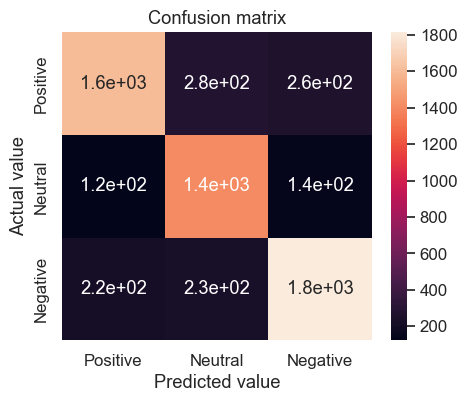

In [53]:
from sklearn.svm import SVC

svc = SVC()

svc.fit(x_train, y_train)

svc_prediction = svc.predict(x_test)
svc_accuracy = accuracy_score(y_test,svc_prediction)
print("Training accuracy Score    : ",svc.score(x_train,y_train))
print("Validation accuracy Score : ",svc_accuracy)
print(classification_report(svc_prediction,y_test))

result=confusion_matrix(y_test,svc_prediction)
result_df=pd.DataFrame(result,index=['Positive','Neutral','Negative'],columns=['Positive','Neutral','Negative'])

plt.figure(figsize=(5,4))
sns.heatmap(result_df,annot=True)
plt.title('Confusion matrix')
plt.ylabel('Actual value')
plt.xlabel('Predicted value')
plt.show()

Training accuracy Score    :  0.8463142872825072
Validation accuracy Score :  0.8072110635495555
              precision    recall  f1-score   support

    Negative       0.77      0.83      0.80      1973
     Neutral       0.87      0.74      0.80      1960
    Positive       0.80      0.85      0.82      2141

    accuracy                           0.81      6074
   macro avg       0.81      0.81      0.81      6074
weighted avg       0.81      0.81      0.81      6074



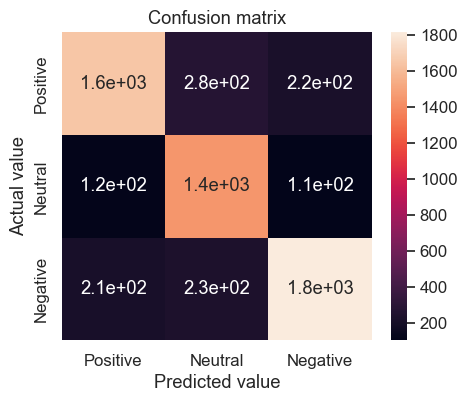

In [54]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

logreg.fit(x_train, y_train)

logreg_prediction = logreg.predict(x_test)
logreg_accuracy = accuracy_score(y_test,logreg_prediction)
print("Training accuracy Score    : ",logreg.score(x_train,y_train))
print("Validation accuracy Score : ",logreg_accuracy )
print(classification_report(logreg_prediction,y_test))
result=confusion_matrix(y_test,logreg_prediction)
result_df=pd.DataFrame(result,index=['Positive','Neutral','Negative'],columns=['Positive','Neutral','Negative'])

plt.figure(figsize=(5,4))
sns.heatmap(result_df,annot=True)
plt.title('Confusion matrix')
plt.ylabel('Actual value')
plt.xlabel('Predicted value')
plt.show()


Training accuracy Score    :  0.9984631428728251
Validation accuracy Score :  0.7216002634178466
              precision    recall  f1-score   support

    Negative       0.70      0.70      0.70      2149
     Neutral       0.73      0.73      0.73      1688
    Positive       0.73      0.74      0.73      2237

    accuracy                           0.72      6074
   macro avg       0.72      0.72      0.72      6074
weighted avg       0.72      0.72      0.72      6074



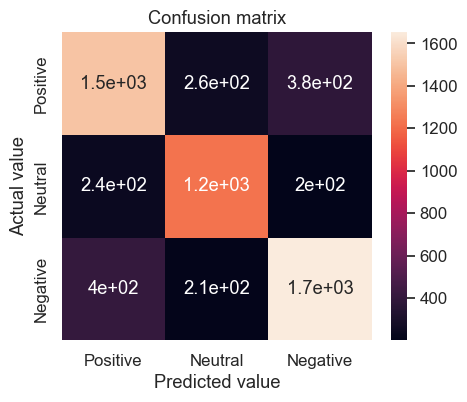

In [55]:
from sklearn.tree import DecisionTreeClassifier
dct = DecisionTreeClassifier(criterion='entropy', random_state=1)
dct.fit(x_train,y_train);
dct_prediction=dct.predict(x_test)
dct_accuracy=accuracy_score(y_test,dct_prediction)
print("Training accuracy Score    : ",dct.score(x_train,y_train))
print("Validation accuracy Score : ",dct_accuracy )
print(classification_report(dct_prediction,y_test))
result=confusion_matrix(y_test,dct_prediction)

result=confusion_matrix(y_test,dct_prediction)
result_df=pd.DataFrame(result,index=['Positive','Neutral','Negative'],columns=['Positive','Neutral','Negative'])

plt.figure(figsize=(5,4))
sns.heatmap(result_df,annot=True)
plt.title('Confusion matrix')
plt.ylabel('Actual value')
plt.xlabel('Predicted value')
plt.show()

,Model,Test accuracy
4,Stochastic Gradient Decent,0.829437
5,XGBoost,0.818736
1,Logistic Regression,0.807211
2,Random Forest,0.801943
0,Support Vector Machines,0.794205
6,Decision Tree,0.721600
3,Naive Bayes,0.711393


In [69]:
!pip install catboost
!pip install ipywidgets
!jupyter nbextension enable --py widgetsnbextension
from catboost import CatBoostClassifier, Pool, cv

     ---------------------------------------- 74.0/74.0 MB 1.1 MB/s eta 0:00:00
     -------------------------------------- 47.0/47.0 kB 782.9 kB/s eta 0:00:00


Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


In [70]:
clf2 = CatBoostClassifier()


clf2.fit(x_train, y_train,  
        eval_set=(x_test, y_test), 
        verbose=False
)

print('CatBoost model is fitted: ' + str(clf2.is_fitted()))
print('CatBoost model parameters:')
print(clf2.get_params())

CatBoost model is fitted: True
CatBoost model parameters:
{}


In [71]:
catboost_prediction = clf2.predict(x_test)
catboost_accuracy = accuracy_score(y_test,catboost_prediction)
print("Training accuracy Score    : ",clf2.score(x_train,y_train))
print("Validation accuracy Score : ",catboost_accuracy )
print(classification_report(catboost_prediction,y_test))

Training accuracy Score    :  0.8457105219825457
Validation accuracy Score :  0.8221929535726046
              precision    recall  f1-score   support

    Negative       0.75      0.87      0.81      1858
     Neutral       0.93      0.74      0.82      2107
    Positive       0.81      0.87      0.84      2109

    accuracy                           0.82      6074
   macro avg       0.83      0.82      0.82      6074
weighted avg       0.83      0.82      0.82      6074



In [72]:
models = pd.DataFrame({
    'Model': ['Support Vector Machines', 'Logistic Regression', 
              'Random Forest', 'Naive Bayes', 
              'Stochastic Gradient Decent', 'XGBoost','Decision Tree','Catboost'],
    'Test accuracy': [svc_accuracy, logreg_accuracy, 
              rf_accuracy, NB_accuracy, 
              sgd_accuracy, xgb_accuracy,dct_accuracy,catboost_accuracy]})

models.sort_values(by='Test accuracy', ascending=False)

,Model,Test accuracy
4,Stochastic Gradient Decent,0.829437
7,Catboost,0.822193
5,XGBoost,0.818736
1,Logistic Regression,0.807211
2,Random Forest,0.801943
0,Support Vector Machines,0.794205
6,Decision Tree,0.721600
3,Naive Bayes,0.711393


In [56]:
new_congress=congress_election[['full_text','sentiment_overall']]
new_congress.head()

,full_text,sentiment_overall
3,india icecream industri stand crore fastest g...,Neutral
7,multitud support across length breath bihar ca...,Positive
8,pappus lawyer repli court latest april d rep...,Neutral
9,ilhan omar made name one radic leftw member na...,Neutral
12,odisha bless mani river still struggl clean wa...,Positive


In [74]:
from sklearn.feature_extraction.text import CountVectorizer
bow_vectorizer=CountVectorizer(max_df=0.9,min_df=2,max_features=1000,stop_words=stopwords)
bow=bow_vectorizer.fit_transform(new_congress['full_text'])

In [76]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(bow,new_congress['sentiment_overall'],random_state=42,stratify=new_congress['sentiment_overall'])

In [77]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(14915, 1000)
(4972, 1000)
(14915,)
(4972,)


In [78]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score
from sklearn import metrics 
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
naiveByes_clf = MultinomialNB()

naiveByes_clf.fit(x_train,y_train)
NB_prediction=naiveByes_clf.predict(x_test)
NB_accuracy=accuracy_score(NB_prediction,y_test)
print("training accuracy Score    : ",naiveByes_clf.score(x_train,y_train))
print("Validation accuracy Score : ",NB_accuracy )
print(classification_report(NB_prediction,y_test))

training accuracy Score    :  0.7530003352329869
Validation accuracy Score :  0.7135961383748994
              precision    recall  f1-score   support

    Negative       0.71      0.72      0.71      1746
     Neutral       0.73      0.70      0.71      1553
    Positive       0.70      0.72      0.71      1673

    accuracy                           0.71      4972
   macro avg       0.71      0.71      0.71      4972
weighted avg       0.71      0.71      0.71      4972



In [79]:
from sklearn.linear_model import SGDClassifier

sgd_clf = SGDClassifier(loss = 'hinge', penalty = 'l2', random_state=42)

sgd_clf.fit(x_train,y_train)

sgd_prediction = sgd_clf.predict(x_test)
sgd_accuracy = accuracy_score(y_test,sgd_prediction)
print("Training accuracy Score    : ",sgd_clf.score(x_train,y_train))
print("Validation accuracy Score : ",sgd_accuracy )
print(classification_report(sgd_prediction,y_test))

Training accuracy Score    :  0.8280925243043915
Validation accuracy Score :  0.8143604183427192
              precision    recall  f1-score   support

    Negative       0.74      0.87      0.80      1502
     Neutral       0.94      0.74      0.82      1890
    Positive       0.78      0.85      0.81      1580

    accuracy                           0.81      4972
   macro avg       0.82      0.82      0.81      4972
weighted avg       0.83      0.81      0.82      4972



In [80]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier()

rf_clf.fit(x_train,y_train)

rf_prediction = rf_clf.predict(x_test)
rf_accuracy = accuracy_score(y_test,rf_prediction)
print("Training accuracy Score    : ",rf_clf.score(x_train,y_train))
print("Validation accuracy Score : ",rf_accuracy )
print(classification_report(rf_prediction,y_test))

Training accuracy Score    :  0.9981897418706001
Validation accuracy Score :  0.7998793242156074
              precision    recall  f1-score   support

    Negative       0.72      0.85      0.78      1496
     Neutral       0.92      0.75      0.82      1817
    Positive       0.78      0.81      0.80      1659

    accuracy                           0.80      4972
   macro avg       0.81      0.80      0.80      4972
weighted avg       0.81      0.80      0.80      4972



In [81]:
import xgboost as xgb

xgboost_clf = xgb.XGBClassifier()

xgboost_clf.fit(x_train, y_train)

xgb_prediction = xgboost_clf.predict(x_test)
xgb_accuracy = accuracy_score(y_test,xgb_prediction)
print("Training accuracy Score    : ",xgboost_clf.score(x_train,y_train))
print("Validation accuracy Score : ",xgb_accuracy )
print(classification_report(xgb_prediction,y_test))

[17:20:00] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Training accuracy Score    :  0.8406302380154207
Validation accuracy Score :  0.8077232502011263
              precision    recall  f1-score   support

    Negative       0.72      0.88      0.79      1440
     Neutral       0.96      0.72      0.82      1966
    Positive       0.77      0.84      0.80      1566

    accuracy                           0.81      4972
   macro avg       0.82      0.82      0.81      4972
weighted avg       0.83      0.81      0.81      4972



In [82]:
from sklearn.svm import SVC

svc = SVC()

svc.fit(x_train, y_train)

svc_prediction = svc.predict(x_test)
svc_accuracy = accuracy_score(y_test,svc_prediction)
print("Training accuracy Score    : ",svc.score(x_train,y_train))
print("Validation accuracy Score : ",svc_accuracy)
print(classification_report(svc_prediction,y_test))

Training accuracy Score    :  0.9145826349312772
Validation accuracy Score :  0.7614641995172968
              precision    recall  f1-score   support

    Negative       0.71      0.79      0.75      1573
     Neutral       0.84      0.72      0.78      1734
    Positive       0.75      0.77      0.76      1665

    accuracy                           0.76      4972
   macro avg       0.77      0.76      0.76      4972
weighted avg       0.77      0.76      0.76      4972



In [83]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

logreg.fit(x_train, y_train)

logreg_prediction = logreg.predict(x_test)
logreg_accuracy = accuracy_score(y_test,logreg_prediction)
print("Training accuracy Score    : ",logreg.score(x_train,y_train))
print("Validation accuracy Score : ",logreg_accuracy )
print(classification_report(logreg_prediction,y_test))

Training accuracy Score    :  0.8342608112638283
Validation accuracy Score :  0.7829847144006437
              precision    recall  f1-score   support

    Negative       0.73      0.82      0.77      1575
     Neutral       0.88      0.73      0.80      1804
    Positive       0.75      0.81      0.78      1593

    accuracy                           0.78      4972
   macro avg       0.79      0.79      0.78      4972
weighted avg       0.79      0.78      0.78      4972



In [84]:
clf2 = CatBoostClassifier()


clf2.fit(x_train, y_train,  
        eval_set=(x_test, y_test), 
        verbose=False
)

print('CatBoost model is fitted: ' + str(clf2.is_fitted()))
print('CatBoost model parameters:')
print(clf2.get_params())

CatBoost model is fitted: True
CatBoost model parameters:
{}


In [85]:
catboost_prediction = clf2.predict(x_test)
catboost_accuracy = accuracy_score(y_test,catboost_prediction)
print("Training accuracy Score    : ",clf2.score(x_train,y_train))
print("Validation accuracy Score : ",catboost_accuracy )
print(classification_report(catboost_prediction,y_test))

Training accuracy Score    :  0.8319141803553469
Validation accuracy Score :  0.8105390185036203
              precision    recall  f1-score   support

    Negative       0.73      0.87      0.80      1485
     Neutral       0.94      0.73      0.82      1920
    Positive       0.77      0.85      0.81      1567

    accuracy                           0.81      4972
   macro avg       0.82      0.82      0.81      4972
weighted avg       0.83      0.81      0.81      4972



In [86]:
models = pd.DataFrame({
    'Model': ['Support Vector Machines', 'Logistic Regression', 
              'Random Forest', 'Naive Bayes', 
              'Stochastic Gradient Decent', 'XGBoost','CatBoost'],
    'Test accuracy': [svc_accuracy, logreg_accuracy, 
              rf_accuracy, NB_accuracy, 
              sgd_accuracy, xgb_accuracy,catboost_accuracy]})

models.sort_values(by='Test accuracy', ascending=False)

,Model,Test accuracy
4,Stochastic Gradient Decent,0.814360
6,CatBoost,0.810539
5,XGBoost,0.807723
2,Random Forest,0.799879
1,Logistic Regression,0.782985
0,Support Vector Machines,0.761464
3,Naive Bayes,0.713596


In [87]:
freq=nltk.FreqDist(bjp_election['hashtags'])

d=pd.DataFrame({'HashTags':list(freq.keys()),
               'Count':list(freq.values())})

d.head()

,HashTags,Count
0,ActEast,1
1,,18797
2,BCCIBetraysBraves,1
3,"EveryVoteForModi,ModiOnceMore",1
4,"Pakistan,India",1


In [124]:
new_data=df[['full_text','subject']]
new_data.head()

,full_text,subject
0,guwahati gain lot promin recent year due pm sh...,Bjp
1,rss school day indoctrin sinc childhood thrice...,Bjp
2,word dont exist vaccummodi post pulwama word g...,Bjp
3,india icecream industri stand crore fastest g...,Congress
4,crpf jawan kill pulwama attackiaf strike paki...,Bjp


In [125]:
x=new_data[['full_text']]
y=new_data[['subject']]
from sklearn.feature_extraction.text import CountVectorizer
bow_vectorizer=CountVectorizer(max_df=0.9,min_df=2,max_features=1000,stop_words=stopwords)
bow=bow_vectorizer.fit_transform(new_data['full_text'])

In [126]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(bow,y,random_state=42)

In [129]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
logreg = LogisticRegression()

logreg.fit(x_train, y_train)

logreg_prediction = logreg.predict(x_test)
logreg_accuracy = accuracy_score(y_test,logreg_prediction)
print("Training accuracy Score    : ",logreg.score(x_train,y_train))
print("Validation accuracy Score : ",logreg_accuracy )
print(classification_report(logreg_prediction,y_test))

Training accuracy Score    :  0.9708676010656783
Validation accuracy Score :  0.9605594648596995
                    precision    recall  f1-score   support

               Bjp       0.98      0.95      0.97      6302
          Congress       0.95      0.97      0.96      4817
            Others       0.81      0.94      0.87       392
['not', 'instead']       0.00      0.00      0.00         0

          accuracy                           0.96     11511
         macro avg       0.68      0.72      0.70     11511
      weighted avg       0.96      0.96      0.96     11511



In [46]:
from sklearn.ensemble import RandomForestClassifier
rmf=RandomForestClassifier(max_depth=18,random_state=0)
rmf_clf=rmf.fit(x_train,y_train)

rmf_prediction = rmf.predict(x_test)
rmf_accuracy = accuracy_score(y_test,rmf_prediction)
print("Training accuracy Score    : ",rmf.score(x_train,y_train))
print("Validation accuracy Score : ",rmf_accuracy )
print(classification_report(rmf_prediction,y_test))

Training accuracy Score    :  0.9605004054210587
Validation accuracy Score :  0.9530883502736512
                    precision    recall  f1-score   support

               Bjp       0.99      0.93      0.96      6567
          Congress       0.93      0.99      0.96      4646
            Others       0.65      1.00      0.79       298
['not', 'instead']       0.00      0.00      0.00         0

          accuracy                           0.95     11511
         macro avg       0.64      0.73      0.68     11511
      weighted avg       0.96      0.95      0.95     11511



In [47]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score
from sklearn import metrics 
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
naiveByes_clf = MultinomialNB()

naiveByes_clf.fit(x_train,y_train)
NB_prediction=naiveByes_clf.predict(x_test)
NB_accuracy=accuracy_score(NB_prediction,y_test)
print("training accuracy Score    : ",naiveByes_clf.score(x_train,y_train))
print("Validation accuracy Score : ",NB_accuracy )
print(classification_report(NB_prediction,y_test))

training accuracy Score    :  0.9201899687246612
Validation accuracy Score :  0.9179914864043089
                    precision    recall  f1-score   support

               Bjp       0.95      0.92      0.93      6315
          Congress       0.89      0.95      0.92      4606
            Others       0.83      0.64      0.72       590
['not', 'instead']       0.00      0.00      0.00         0

          accuracy                           0.92     11511
         macro avg       0.67      0.63      0.64     11511
      weighted avg       0.92      0.92      0.92     11511



In [17]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
svc = SVC()

svc.fit(x_train, y_train)

svc_prediction = svc.predict(x_test)
svc_accuracy = accuracy_score(y_test,svc_prediction)
print("Training accuracy Score    : ",svc.score(x_train,y_train))
print("Validation accuracy Score : ",svc_accuracy)
print(classification_report(svc_prediction,y_test))

Training accuracy Score    :  0.9795551951812811
Validation accuracy Score :  0.9614281991138911
                    precision    recall  f1-score   support

               Bjp       0.99      0.94      0.97      6418
          Congress       0.95      0.98      0.96      4755
            Others       0.74      1.00      0.85       338
['not', 'instead']       0.00      0.00      0.00         0

          accuracy                           0.96     11511
         macro avg       0.67      0.73      0.70     11511
      weighted avg       0.96      0.96      0.96     11511



In [18]:
from sklearn.linear_model import SGDClassifier

sgd_clf = SGDClassifier(loss = 'hinge', penalty = 'l2', random_state=42)

sgd_clf.fit(x_train,y_train)

sgd_prediction = sgd_clf.predict(x_test)
sgd_accuracy = accuracy_score(y_test,sgd_prediction)
print("Training accuracy Score    : ",sgd_clf.score(x_train,y_train))
print("Validation accuracy Score : ",sgd_accuracy )
print(classification_report(sgd_prediction,y_test))

Training accuracy Score    :  0.9653364994787443
Validation accuracy Score :  0.9609069585613761
                    precision    recall  f1-score   support

               Bjp       0.98      0.95      0.96      6336
          Congress       0.95      0.97      0.96      4816
            Others       0.78      1.00      0.87       354
          ['govt']       0.00      0.00      0.00         1
['not', 'instead']       0.00      0.00      0.00         0
           ['now']       0.00      0.00      0.00         4

          accuracy                           0.96     11511
         macro avg       0.45      0.49      0.47     11511
      weighted avg       0.96      0.96      0.96     11511



In [19]:
import xgboost as xgb

xgboost_clf = xgb.XGBClassifier()

xgboost_clf.fit(x_train, y_train)

xgb_prediction = xgboost_clf.predict(x_test)
xgb_accuracy = accuracy_score(y_test,xgb_prediction)
print("Training accuracy Score    : ",xgboost_clf.score(x_train,y_train))
print("Validation accuracy Score : ",xgb_accuracy )
print(classification_report(xgb_prediction,y_test))

[17:35:10] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Training accuracy Score    :  0.9770068342407042
Validation accuracy Score :  0.9700286682303884
                    precision    recall  f1-score   support

               Bjp       0.99      0.96      0.97      6317
          Congress       0.96      0.98      0.97      4820
            Others       0.81      0.99      0.89       374
['not', 'instead']       0.00      0.00      0.00         0

          accuracy                           0.97     11511
         macro avg       0.69      0.73      0.71     11511
      weighted avg       0.97      0.97      0.97     11511



In [104]:
models = pd.DataFrame({
    'Model': ['Support Vector Machines', 'Logistic Regression', 
              'Random Forest', 'Naive Bayes', 
              'Stochastic Gradient Decent', 'XGBoost','CatBoost'],
    'Test accuracy': [svc_accuracy, logreg_accuracy, 
              rf_accuracy, NB_accuracy, 
              sgd_accuracy, xgb_accuracy,catboost_accuracy]})

models.sort_values(by='Test accuracy', ascending=False)

NameError: name 'svc_accuracy' is not defined

In [57]:
new_data=df[['full_text']]
import nltk

In [58]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()
new_data['sentiment'] = new_data['full_text'].apply(lambda x: sid.polarity_scores(x))

def sentimentVerdict(sentiment):
  if sentiment['compound'] >= 0.05:
    return "Positive"
  elif sentiment['compound'] <= -0.05:
    return "Negative"
  else:
    return "Neutral"

new_data['sentiment_overall'] = new_data['sentiment'].apply(lambda x: sentimentVerdict(x))

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [59]:
new_data.head()

,full_text,sentiment,sentiment_overall
0,guwahati gain lot promin recent year due pm sh...,"{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'comp...",Positive
1,rss school day indoctrin sinc childhood thrice...,"{'neg': 0.421, 'neu': 0.458, 'pos': 0.121, 'co...",Negative
2,word dont exist vaccummodi post pulwama word g...,"{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'comp...",Negative
3,india icecream industri stand crore fastest g...,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,"{'neg': 0.396, 'neu': 0.604, 'pos': 0.0, 'comp...",Negative


In [60]:
new_data=new_data[['full_text','sentiment_overall']]
new_data.head()

,full_text,sentiment_overall
0,guwahati gain lot promin recent year due pm sh...,Positive
1,rss school day indoctrin sinc childhood thrice...,Negative
2,word dont exist vaccummodi post pulwama word g...,Negative
3,india icecream industri stand crore fastest g...,Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,Negative


In [61]:
from sklearn.feature_extraction.text import CountVectorizer
bow_vectorizer=CountVectorizer(max_df=0.9,min_df=2,max_features=1000,stop_words=stopwords)
bow=bow_vectorizer.fit_transform(new_data['full_text'])

In [62]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(bow,new_data['sentiment_overall'],random_state=42)

In [63]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()

logreg.fit(x_train, y_train)

logreg_prediction = logreg.predict(x_test)
logreg_accuracy = accuracy_score(y_test,logreg_prediction)
print("Training accuracy Score    : ",logreg.score(x_train,y_train))
print("Validation accuracy Score : ",logreg_accuracy )
print(classification_report(logreg_prediction,y_test))

Training accuracy Score    :  0.8204563882775396
Validation accuracy Score :  0.800625488663018
              precision    recall  f1-score   support

    Negative       0.75      0.85      0.80      3482
     Neutral       0.91      0.71      0.80      4067
    Positive       0.77      0.85      0.81      3962

    accuracy                           0.80     11511
   macro avg       0.81      0.80      0.80     11511
weighted avg       0.81      0.80      0.80     11511



In [64]:
from sklearn.ensemble import RandomForestClassifier
rmf=RandomForestClassifier(max_depth=18,random_state=0)
rmf_clf=rmf.fit(x_train,y_train)

rmf_prediction = rmf.predict(x_test)
rmf_accuracy = accuracy_score(y_test,rmf_prediction)
print("Training accuracy Score    : ",rmf.score(x_train,y_train))
print("Validation accuracy Score : ",rmf_accuracy )
print(classification_report(rmf_prediction,y_test))

Training accuracy Score    :  0.7667960152901656
Validation accuracy Score :  0.72973677352098
              precision    recall  f1-score   support

    Negative       0.61      0.86      0.72      2822
     Neutral       0.84      0.63      0.72      4218
    Positive       0.75      0.74      0.75      4471

    accuracy                           0.73     11511
   macro avg       0.74      0.74      0.73     11511
weighted avg       0.75      0.73      0.73     11511



In [33]:
import xgboost as xgb

xgboost_clf = xgb.XGBClassifier()

xgboost_clf.fit(x_train, y_train)

xgb_prediction = xgboost_clf.predict(x_test)
xgb_accuracy = accuracy_score(y_test,xgb_prediction)
print("Training accuracy Score    : ",xgboost_clf.score(x_train,y_train))
print("Validation accuracy Score : ",xgb_accuracy )
print(classification_report(xgb_prediction,y_test))

[17:59:45] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Training accuracy Score    :  0.8477064751534809
Validation accuracy Score :  0.8140908696029885
              precision    recall  f1-score   support

    Negative       0.73      0.88      0.80      3295
     Neutral       0.95      0.72      0.82      4145
    Positive       0.80      0.86      0.83      4071

    accuracy                           0.81     11511
   macro avg       0.82      0.82      0.81     11511
weighted avg       0.83      0.81      0.81     11511



In [34]:
from sklearn.linear_model import SGDClassifier

sgd_clf = SGDClassifier(loss = 'hinge', penalty = 'l2', random_state=42)

sgd_clf.fit(x_train,y_train)

sgd_prediction = sgd_clf.predict(x_test)
sgd_accuracy = accuracy_score(y_test,sgd_prediction)
print("Training accuracy Score    : ",sgd_clf.score(x_train,y_train))
print("Validation accuracy Score : ",sgd_accuracy )
print(classification_report(sgd_prediction,y_test))

Training accuracy Score    :  0.8351094636858566
Validation accuracy Score :  0.8259056554599948
              precision    recall  f1-score   support

    Negative       0.75      0.88      0.81      3375
     Neutral       0.95      0.73      0.83      4076
    Positive       0.81      0.88      0.84      4060

    accuracy                           0.83     11511
   macro avg       0.83      0.83      0.83     11511
weighted avg       0.84      0.83      0.83     11511



In [19]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
svc = SVC()
svc.fit(x_train, y_train)
svc_prediction = svc.predict(x_test)
svc_accuracy = accuracy_score(y_test,svc_prediction)
print("Training accuracy Score    : ",svc.score(x_train,y_train))
print("Validation accuracy Score : ",svc_accuracy)
print(classification_report(svc_prediction,y_test))

Training accuracy Score    :  0.9091277655507934
Validation accuracy Score :  0.8062722613152636
              precision    recall  f1-score   support

    Negative       0.74      0.85      0.79      3444
     Neutral       0.90      0.74      0.81      3834
    Positive       0.80      0.83      0.82      4233

    accuracy                           0.81     11511
   macro avg       0.81      0.81      0.81     11511
weighted avg       0.81      0.81      0.81     11511



In [20]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import f1_score
from sklearn import metrics 
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
naiveByes_clf = MultinomialNB()
naiveByes_clf.fit(x_train,y_train)
NB_prediction=naiveByes_clf.predict(x_test)
NB_accuracy=accuracy_score(NB_prediction,y_test)
print("training accuracy Score    : ",naiveByes_clf.score(x_train,y_train))
print("Validation accuracy Score : ",NB_accuracy )
print(classification_report(NB_prediction,y_test))

training accuracy Score    :  0.7455403683539905
Validation accuracy Score :  0.7200938232994527
              precision    recall  f1-score   support

    Negative       0.72      0.74      0.73      3864
     Neutral       0.69      0.68      0.69      3227
    Positive       0.74      0.74      0.74      4420

    accuracy                           0.72     11511
   macro avg       0.72      0.72      0.72     11511
weighted avg       0.72      0.72      0.72     11511



In [ ]:
models = pd.DataFrame({
    'Model': ['Support Vector Machines', 'Logistic Regression', 
              'Random Forest', 'Naive Bayes', 
              'Stochastic Gradient Decent', 'XGBoost'],
    'Test accuracy': [svc_accuracy, logreg_accuracy, 
              rf_accuracy, NB_accuracy, 
              sgd_accuracy, xgb_accuracy]})

models.sort_values(by='Test accuracy', ascending=False)

In [19]:
from keras.preprocessing.text import one_hot,Tokenizer
from tensorflow.keras.utils import pad_sequences
from keras.models import Sequential
from keras.layers.core import Activation, Dropout, Dense
from keras.layers import Flatten, GlobalMaxPooling1D, Embedding, Conv1D, LSTM
from sklearn.model_selection import train_test_split

In [66]:
x=[]
sentences=list(new_data['full_text'])
for sen in sentences:
    x.append(sen)
y=new_data['sentiment_overall']
y=y.map({'Positive':1,'Negative':0,'Neutral':1})

In [67]:
X_train,X_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=42)

In [68]:
word_tokenizer=Tokenizer()
word_tokenizer.fit_on_texts(X_train)

X_train=word_tokenizer.texts_to_sequences(X_train)
X_test=word_tokenizer.texts_to_sequences(X_test)

In [69]:
vocab_length=len(word_tokenizer.word_index)+1

vocab_length

69862

In [70]:
maxlen=100

X_train=pad_sequences(X_train,padding='post',maxlen=maxlen)
X_test=pad_sequences(X_test,padding='post',maxlen=maxlen)

In [71]:
from numpy import asarray
from numpy import zeros

embeddings_dictionary=dict()
glove_file=open('a2_glove.6B.100d.txt',encoding="utf8")

for line in glove_file:
    records=line.split()
    word=records[0]
    vector_dimensions=asarray(records[1:],dtype='float32')
    embeddings_dictionary[word]=vector_dimensions
    
glove_file.close() 

In [72]:
embedding_matrix = zeros((vocab_length, 100))
for word, index in word_tokenizer.word_index.items():
    embedding_vector = embeddings_dictionary.get(word)
    if embedding_vector is not None:
        embedding_matrix[index] = embedding_vector

In [73]:
embedding_matrix.shape

(69862, 100)

In [74]:
snn_model = Sequential()
embedding_layer = Embedding(vocab_length, 100, weights=[embedding_matrix], input_length=maxlen , trainable=False)

snn_model.add(embedding_layer)

snn_model.add(Flatten())
snn_model.add(Dense(1, activation='sigmoid'))

In [75]:
snn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])

print(snn_model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 100, 100)          6986200   
                                                                 
 flatten (Flatten)           (None, 10000)             0         
                                                                 
 dense (Dense)               (None, 1)                 10001     
                                                                 
Total params: 6,996,201
Trainable params: 10,001
Non-trainable params: 6,986,200
_________________________________________________________________
None


In [86]:
snn_model_history = snn_model.fit(X_train, y_train, batch_size=128, epochs=6, verbose=1, validation_split=0.2)

Epoch 1/6
231/231 [==============================] - 2s 5ms/step - loss: 0.5749 - acc: 0.7129 - val_loss: 0.5273 - val_acc: 0.7515
Epoch 2/6
231/231 [==============================] - 1s 5ms/step - loss: 0.5054 - acc: 0.7653 - val_loss: 0.5093 - val_acc: 0.7584
Epoch 3/6
231/231 [==============================] - 1s 5ms/step - loss: 0.4816 - acc: 0.7798 - val_loss: 0.5003 - val_acc: 0.7673
Epoch 4/6
231/231 [==============================] - 1s 5ms/step - loss: 0.4674 - acc: 0.7866 - val_loss: 0.4974 - val_acc: 0.7656
Epoch 5/6
231/231 [==============================] - 1s 5ms/step - loss: 0.4581 - acc: 0.7924 - val_loss: 0.4973 - val_acc: 0.7672
Epoch 6/6
231/231 [==============================] - 1s 5ms/step - loss: 0.4508 - acc: 0.7955 - val_loss: 0.4986 - val_acc: 0.7686


In [87]:
score = snn_model.evaluate(X_test, y_test, verbose=1)

288/288 [==============================] - 1s 2ms/step - loss: 0.5100 - acc: 0.7634


In [88]:
print("Test Score:", score[0])
print("Test Accuracy:", score[1])

Test Score: 0.5099710822105408
Test Accuracy: 0.7633836269378662


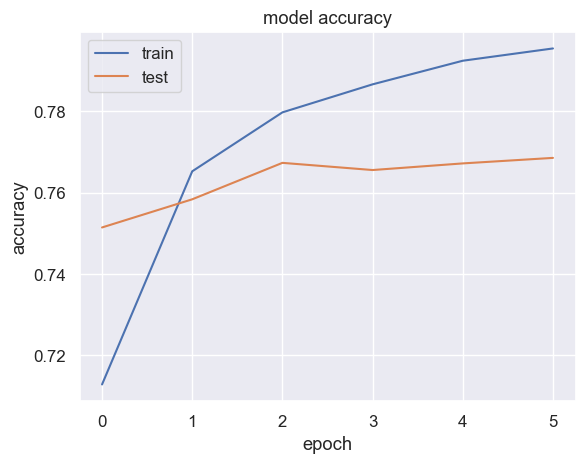

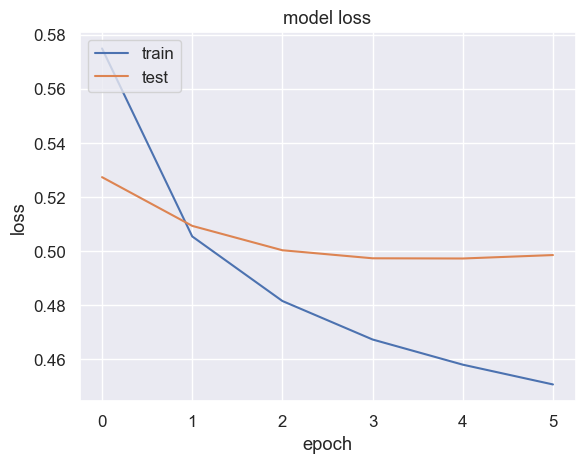

In [89]:
import matplotlib.pyplot as plt

plt.plot(snn_model_history.history['acc'])
plt.plot(snn_model_history.history['val_acc'])

plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()

plt.plot(snn_model_history.history['loss'])
plt.plot(snn_model_history.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()


In [90]:
from keras.layers import Conv1D

In [91]:
cnn_model = Sequential()

embedding_layer = Embedding(vocab_length, 100, weights=[embedding_matrix], input_length=maxlen , trainable=False)
cnn_model.add(embedding_layer)

cnn_model.add(Conv1D(128, 5, activation='relu'))
cnn_model.add(GlobalMaxPooling1D())
cnn_model.add(Dense(1, activation='sigmoid'))

In [92]:
cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
print(cnn_model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 100, 100)          6986200   
                                                                 
 conv1d (Conv1D)             (None, 96, 128)           64128     
                                                                 
 global_max_pooling1d (Globa  (None, 128)              0         
 lMaxPooling1D)                                                  
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 7,050,457
Trainable params: 64,257
Non-trainable params: 6,986,200
_________________________________________________________________
None


In [93]:
cnn_model_history=cnn_model.fit(X_train, y_train, batch_size=128, epochs=6, verbose=1, validation_split=0.2)

Epoch 1/6
231/231 [==============================] - 9s 37ms/step - loss: 0.4707 - acc: 0.7751 - val_loss: 0.4258 - val_acc: 0.8007
Epoch 2/6
231/231 [==============================] - 8s 37ms/step - loss: 0.3530 - acc: 0.8473 - val_loss: 0.3738 - val_acc: 0.8320
Epoch 3/6
231/231 [==============================] - 8s 37ms/step - loss: 0.2880 - acc: 0.8843 - val_loss: 0.3480 - val_acc: 0.8476
Epoch 4/6
231/231 [==============================] - 10s 45ms/step - loss: 0.2365 - acc: 0.9127 - val_loss: 0.3310 - val_acc: 0.8599
Epoch 5/6
231/231 [==============================] - 11s 49ms/step - loss: 0.1922 - acc: 0.9369 - val_loss: 0.3308 - val_acc: 0.8639
Epoch 6/6
231/231 [==============================] - 11s 49ms/step - loss: 0.1549 - acc: 0.9549 - val_loss: 0.3346 - val_acc: 0.8630


In [94]:
score = cnn_model.evaluate(X_test, y_test, verbose=1)

288/288 [==============================] - 1s 5ms/step - loss: 0.3512 - acc: 0.8535


In [95]:
print("Test Score:", score[0])
print("Test Accuracy:", score[1])

Test Score: 0.35119864344596863
Test Accuracy: 0.8535128831863403


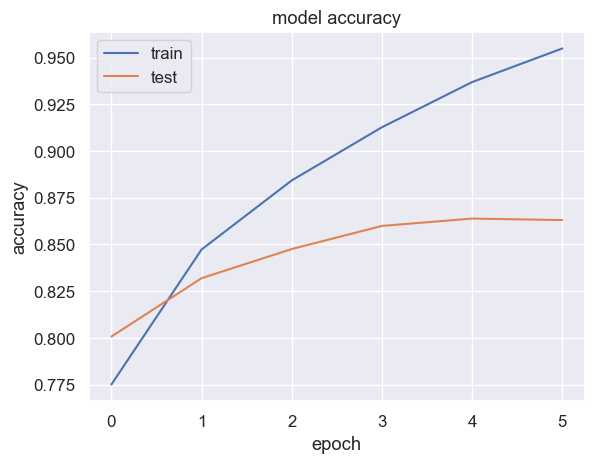

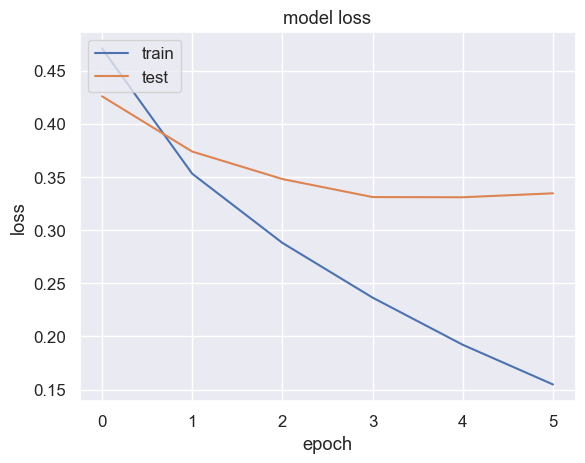

In [96]:
import matplotlib.pyplot as plt

plt.plot(cnn_model_history.history['acc'])
plt.plot(cnn_model_history.history['val_acc'])

plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc = 'upper left')
plt.show()

plt.plot(cnn_model_history.history['loss'])
plt.plot(cnn_model_history.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc = 'upper left')
plt.show()

In [97]:
from keras.layers import LSTM

In [98]:
lstm_model = Sequential()
embedding_layer = Embedding(vocab_length, 100, weights=[embedding_matrix], input_length=maxlen , trainable=False)

lstm_model.add(embedding_layer)
lstm_model.add(LSTM(128))

lstm_model.add(Dense(1, activation='sigmoid'))

In [99]:
lstm_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
print(lstm_model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 100, 100)          6986200   
                                                                 
 lstm (LSTM)                 (None, 128)               117248    
                                                                 
 dense_2 (Dense)             (None, 1)                 129       
                                                                 
Total params: 7,103,577
Trainable params: 117,377
Non-trainable params: 6,986,200
_________________________________________________________________
None


In [100]:
lstm_model_history = lstm_model.fit(X_train, y_train, batch_size=128, epochs=6, verbose=1, validation_split=0.2)


Epoch 1/6
231/231 [==============================] - 39s 159ms/step - loss: 0.6518 - acc: 0.6513 - val_loss: 0.6473 - val_acc: 0.6521
Epoch 2/6
231/231 [==============================] - 38s 164ms/step - loss: 0.6468 - acc: 0.6519 - val_loss: 0.6466 - val_acc: 0.6521
Epoch 3/6
231/231 [==============================] - 40s 175ms/step - loss: 0.6464 - acc: 0.6519 - val_loss: 0.6485 - val_acc: 0.6521
Epoch 4/6
231/231 [==============================] - 49s 213ms/step - loss: 0.6467 - acc: 0.6519 - val_loss: 0.6476 - val_acc: 0.6521
Epoch 5/6
231/231 [==============================] - 48s 208ms/step - loss: 0.6466 - acc: 0.6519 - val_loss: 0.6466 - val_acc: 0.6521
Epoch 6/6
231/231 [==============================] - 48s 208ms/step - loss: 0.6465 - acc: 0.6519 - val_loss: 0.6462 - val_acc: 0.6521


In [101]:
score = lstm_model.evaluate(X_test, y_test, verbose=1)

288/288 [==============================] - 8s 26ms/step - loss: 0.6422 - acc: 0.6586


In [102]:
print("Test Score:", score[0])
print("Test Accuracy:", score[1])

Test Score: 0.6422088146209717
Test Accuracy: 0.6585948467254639


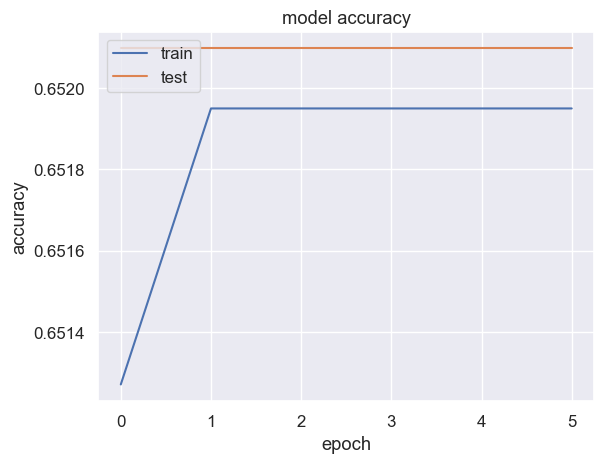

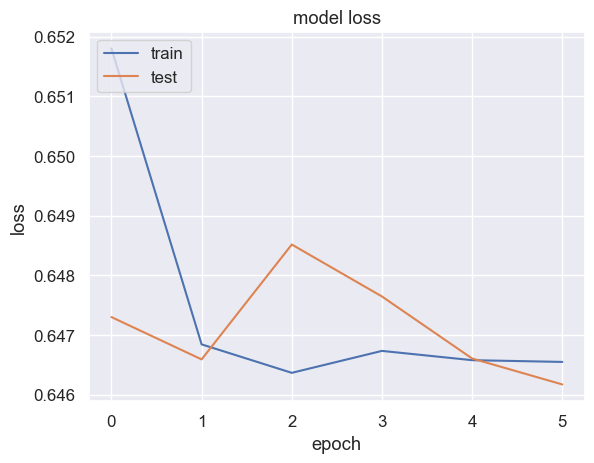

In [103]:
import matplotlib.pyplot as plt

plt.plot(lstm_model_history.history['acc'])
plt.plot(lstm_model_history.history['val_acc'])

plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()

plt.plot(lstm_model_history.history['loss'])
plt.plot(lstm_model_history.history['val_loss'])

plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper left')
plt.show()

In [76]:
# The maximum number of words to be used. (most frequent)
MAX_NB_WORDS = 50000
# Max number of words in each complaint.
MAX_SEQUENCE_LENGTH = 250
# This is fixed.
EMBEDDING_DIM = 100

tokenizer = Tokenizer(num_words=MAX_NB_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)
tokenizer.fit_on_texts(new_data['full_text'].values)
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

Found 81676 unique tokens.


In [77]:
X = tokenizer.texts_to_sequences(new_data['full_text'].values)
X = pad_sequences(X, maxlen=MAX_SEQUENCE_LENGTH)
print('Shape of data tensor:', X.shape)

Shape of data tensor: (46043, 250)


In [78]:
Y = pd.get_dummies(new_data['sentiment_overall']).values
print('Shape of label tensor:', Y.shape)

Shape of label tensor: (46043, 3)


In [79]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.10, random_state = 42)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(41438, 250) (41438, 3)
(4605, 250) (4605, 3)


In [80]:
from tensorflow.keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
model = Sequential()
model.add(Embedding(MAX_NB_WORDS, EMBEDDING_DIM, input_length=X.shape[1]))
model.add(SpatialDropout1D(0.2))
model.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(3, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 250, 100)          5000000   
                                                                 
 spatial_dropout1d (SpatialD  (None, 250, 100)         0         
 ropout1D)                                                       
                                                                 
 lstm (LSTM)                 (None, 100)               80400     
                                                                 
 dense_1 (Dense)             (None, 3)                 303       
                                                                 
Total params: 5,080,703
Trainable params: 5,080,703
Non-trainable params: 0
_________________________________________________________________
None


In [81]:
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dropout
epochs = 5
batch_size = 64

history = model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.0001)])

Epoch 1/5
583/583 [==============================] - 1435s 2s/step - loss: 0.5618 - accuracy: 0.7674 - val_loss: 0.2804 - val_accuracy: 0.9158
Epoch 2/5
583/583 [==============================] - 551s 946ms/step - loss: 0.2124 - accuracy: 0.9369 - val_loss: 0.2548 - val_accuracy: 0.9187
Epoch 3/5
583/583 [==============================] - 562s 964ms/step - loss: 0.1520 - accuracy: 0.9553 - val_loss: 0.2784 - val_accuracy: 0.9131
Epoch 4/5
583/583 [==============================] - 570s 978ms/step - loss: 0.1235 - accuracy: 0.9634 - val_loss: 0.3014 - val_accuracy: 0.9105
Epoch 5/5
583/583 [==============================] - 567s 972ms/step - loss: 0.0973 - accuracy: 0.9701 - val_loss: 0.3537 - val_accuracy: 0.9015


In [82]:
accr = model.evaluate(X_test,Y_test)
print('Test set\n  Loss: {:0.3f}\n  Accuracy: {:0.3f}'.format(accr[0],accr[1]))
     

144/144 [==============================] - 12s 82ms/step - loss: 0.3807 - accuracy: 0.8975
Test set
  Loss: 0.381
  Accuracy: 0.898


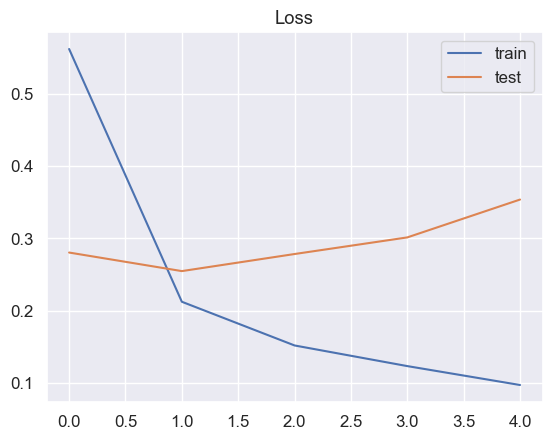

In [83]:
plt.title('Loss')
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show();

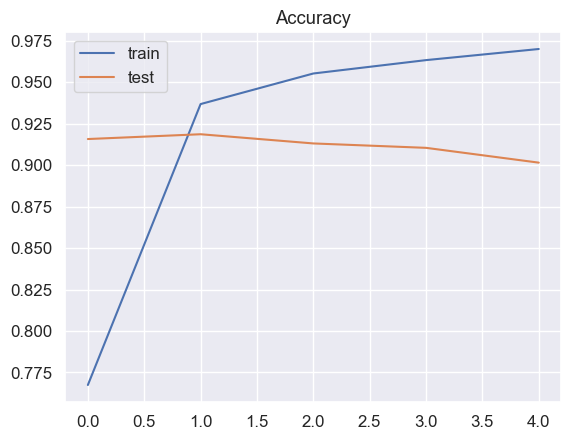

In [84]:
plt.title('Accuracy')
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='test')
plt.legend()
plt.show();

In [33]:
test=pd.read_csv('All_Text_Output.csv')
test.head()

,Text OUTPUT
0,"['ANI', '@ANI', 'Telangana: Hyderabad', 'Polic..."
1,"['Whole bollywood; Left ecosystem', 'Is after ..."
2,"['Meerut: Man changes identity to trap', 'Ghaz..."
3,['Boss is back in buisness']
4,"['Sharjil Imam tested Positive', 'for Coronavi..."


In [42]:
text=['@Itrallpallbics RSS people attacked My home today No; didnt Mat maan Tu mat maan They']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['Positive', 'Negative', 'Neural']
print(pred, labels[np.argmax(pred)])
     

1/1 [==============================] - 0s 52ms/step
[[0.40518668 0.06456624 0.5302471 ]] Neural


In [41]:
text=['ANI @ANI Telangana: Hyderabad Police has arrested a man for posing as a COVID-19 recovered patient and cheating people in the guise of donating plasma and supplying antivira medicine @ibrollja814.761&arra3cF City']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['Positive', 'Negative', 'Neural']
print(pred, labels[np.argmax(pred)])
     

1/1 [==============================] - 0s 52ms/step
[[0.03525466 0.95142114 0.01332409]] Negative


In [20]:
new_data=df[['full_text','hashtags','subject']]
new_data.head()

,full_text,hashtags,subject
0,guwahati gain lot promin recent year due pm sh...,ActEast,Bjp
1,rss school day indoctrin sinc childhood thrice...,,Bjp
2,word dont exist vaccummodi post pulwama word g...,,Bjp
3,india icecream industri stand crore fastest g...,Icecream,Congress
4,crpf jawan kill pulwama attackiaf strike paki...,,Bjp


In [21]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
sid = SentimentIntensityAnalyzer()
new_data['sentiment'] = new_data['full_text'].apply(lambda x: sid.polarity_scores(x))

def sentimentVerdict(sentiment):
  if sentiment['compound'] >= 0.05:
    return "Positive"
  elif sentiment['compound'] <= -0.05:
    return "Negative"
  else:
    return "Neutral"

new_data['sentiment_overall'] = new_data['sentiment'].apply(lambda x: sentimentVerdict(x))

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [22]:
new_data.head()

,full_text,hashtags,subject,sentiment,sentiment_overall
0,guwahati gain lot promin recent year due pm sh...,ActEast,Bjp,"{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'comp...",Positive
1,rss school day indoctrin sinc childhood thrice...,,Bjp,"{'neg': 0.421, 'neu': 0.458, 'pos': 0.121, 'co...",Negative
2,word dont exist vaccummodi post pulwama word g...,,Bjp,"{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'comp...",Negative
3,india icecream industri stand crore fastest g...,Icecream,Congress,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,,Bjp,"{'neg': 0.396, 'neu': 0.604, 'pos': 0.0, 'comp...",Negative


In [23]:
new_data.drop(['sentiment'], axis=1)

,full_text,hashtags,subject,sentiment_overall
0,guwahati gain lot promin recent year due pm sh...,ActEast,Bjp,Positive
1,rss school day indoctrin sinc childhood thrice...,,Bjp,Negative
2,word dont exist vaccummodi post pulwama word g...,,Bjp,Negative
3,india icecream industri stand crore fastest g...,Icecream,Congress,Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,,Bjp,Negative
...,...,...,...,...
46038,articl today bspsp combin firm plan take bjp ...,,Bjp,Neutral
46039,noida homebuy like antrikshsanskr ghaziabad ...,"Noida,homebuyers,AntrikshSanskriti,Ghaziabad",Bjp,Positive
46040,modi noth last yrs speach fill lie power abso...,,Bjp,Neutral
46041,congress turn heat white hous answer journalis...,,Congress,Negative


In [24]:
new_data['total_sentiment']=new_data['subject'] + ' ' + new_data['sentiment_overall'].astype(str)
new_data['total_sentiment']

0             Bjp Positive
1             Bjp Negative
2             Bjp Negative
3         Congress Neutral
4             Bjp Negative
               ...        
46038          Bjp Neutral
46039         Bjp Positive
46040          Bjp Neutral
46041    Congress Negative
46042    Congress Negative
Name: total_sentiment, Length: 46043, dtype: object

In [25]:
new_data.head()

,full_text,hashtags,subject,sentiment,sentiment_overall,total_sentiment
0,guwahati gain lot promin recent year due pm sh...,ActEast,Bjp,"{'neg': 0.0, 'neu': 0.816, 'pos': 0.184, 'comp...",Positive,Bjp Positive
1,rss school day indoctrin sinc childhood thrice...,,Bjp,"{'neg': 0.421, 'neu': 0.458, 'pos': 0.121, 'co...",Negative,Bjp Negative
2,word dont exist vaccummodi post pulwama word g...,,Bjp,"{'neg': 0.114, 'neu': 0.886, 'pos': 0.0, 'comp...",Negative,Bjp Negative
3,india icecream industri stand crore fastest g...,Icecream,Congress,"{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound...",Neutral,Congress Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,,Bjp,"{'neg': 0.396, 'neu': 0.604, 'pos': 0.0, 'comp...",Negative,Bjp Negative


In [26]:
def processsentiment(sentiment):
  if sentiment =='Bjp Positive':
    return "Bjp_Positive"
  elif sentiment =='Bjp Negative':
    return "Bjp_Negative"
  elif sentiment =='Bjp Neutral':
    return "Bjp_Neutral"
  elif sentiment =='Congress Positive':
    return "Congress_Positive"
  elif sentiment =='Congress Negative':
    return "Congress_Negative"
  elif sentiment =='Congress Neutral':
    return "Congress_Neutral"    
  elif sentiment==' Positive':
    return "Others_Positive"
  elif sentiment=='[] Neutral' or sentiment=="['not','instead'] Neutral" or sentiment ==' Neutral' or sentiment=="['govt'] Neutral" or sentiment=="['now'] Neutral":
    return "Others_Neutral"
  elif sentiment == ' Negative':
    return "Others_Negative"
  

new_data['total_sentiment'] = new_data['total_sentiment'].apply(lambda x: processsentiment(x))

In [27]:
new_data.total_sentiment.unique()

array(['Bjp_Positive', 'Bjp_Negative', 'Congress_Neutral',
       'Congress_Positive', 'Bjp_Neutral', 'Congress_Negative', None,
       'Others_Positive', 'Others_Neutral', 'Others_Negative'],
      dtype=object)

In [28]:
new_data=new_data[['full_text','total_sentiment']]
new_data.head()

,full_text,total_sentiment
0,guwahati gain lot promin recent year due pm sh...,Bjp_Positive
1,rss school day indoctrin sinc childhood thrice...,Bjp_Negative
2,word dont exist vaccummodi post pulwama word g...,Bjp_Negative
3,india icecream industri stand crore fastest g...,Congress_Neutral
4,crpf jawan kill pulwama attackiaf strike paki...,Bjp_Negative


In [29]:
# The maximum number of words to be used. (most frequent)
MAX_NB_WORDS = 50000
# Max number of words in each complaint.
MAX_SEQUENCE_LENGTH = 250
# This is fixed.
EMBEDDING_DIM = 100

tokenizer = Tokenizer(num_words=MAX_NB_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)
tokenizer.fit_on_texts(new_data['full_text'].values)
word_index = tokenizer.word_index
print('Found %s unique tokens.' % len(word_index))

Found 81676 unique tokens.


In [30]:
X = tokenizer.texts_to_sequences(new_data['full_text'].values)
X = pad_sequences(X, maxlen=MAX_SEQUENCE_LENGTH)
print('Shape of data tensor:', X.shape)

Shape of data tensor: (46043, 250)


In [31]:
Y = pd.get_dummies(new_data['total_sentiment']).values
print('Shape of label tensor:', Y.shape)

Shape of label tensor: (46043, 9)


In [32]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.10, random_state = 42)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(41438, 250) (41438, 9)
(4605, 250) (4605, 9)


In [33]:
from tensorflow.keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
model = Sequential()
model.add(Embedding(MAX_NB_WORDS, EMBEDDING_DIM, input_length=X.shape[1]))
model.add(SpatialDropout1D(0.2))
model.add(LSTM(100, dropout=0.2, recurrent_dropout=0.2))
model.add(Dense(9, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 250, 100)          5000000   
                                                                 
 spatial_dropout1d (SpatialD  (None, 250, 100)         0         
 ropout1D)                                                       
                                                                 
 lstm (LSTM)                 (None, 100)               80400     
                                                                 
 dense (Dense)               (None, 9)                 909       
                                                                 
Total params: 5,081,309
Trainable params: 5,081,309
Non-trainable params: 0
_________________________________________________________________
None


In [34]:
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Dropout
epochs = 5
batch_size = 64

history = model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,validation_split=0.1,callbacks=[EarlyStopping(monitor='val_loss', patience=3, min_delta=0.0001)])

Epoch 1/5
583/583 [==============================] - 2461s 4s/step - loss: 1.0637 - accuracy: 0.5173 - val_loss: 0.5531 - val_accuracy: 0.7850
Epoch 2/5
583/583 [==============================] - 964s 2s/step - loss: 0.3902 - accuracy: 0.8486 - val_loss: 0.3906 - val_accuracy: 0.8472
Epoch 3/5
583/583 [==============================] - 609s 1s/step - loss: 0.2630 - accuracy: 0.8897 - val_loss: 0.4038 - val_accuracy: 0.8422
Epoch 4/5
583/583 [==============================] - 620s 1s/step - loss: 0.2060 - accuracy: 0.9048 - val_loss: 0.4021 - val_accuracy: 0.8456
Epoch 5/5
583/583 [==============================] - 598s 1s/step - loss: 0.1657 - accuracy: 0.9159 - val_loss: 0.4348 - val_accuracy: 0.8352


In [35]:
accr = model.evaluate(X_test,Y_test)
print('Test set\n  Loss: {:0.3f}\n  Accuracy: {:0.3f}'.format(accr[0],accr[1]))
     

144/144 [==============================] - 10s 72ms/step - loss: 0.4359 - accuracy: 0.8289
Test set
  Loss: 0.436
  Accuracy: 0.829


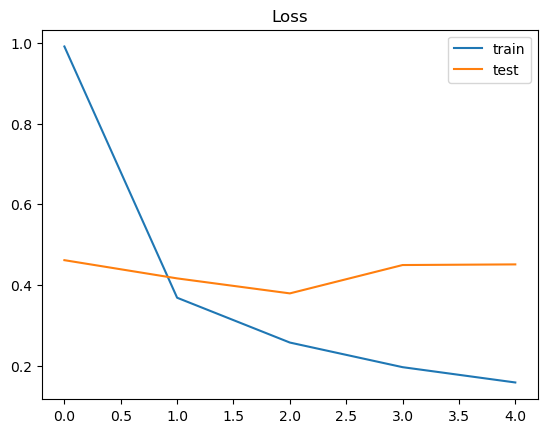

In [40]:
plt.title('Loss')
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show();

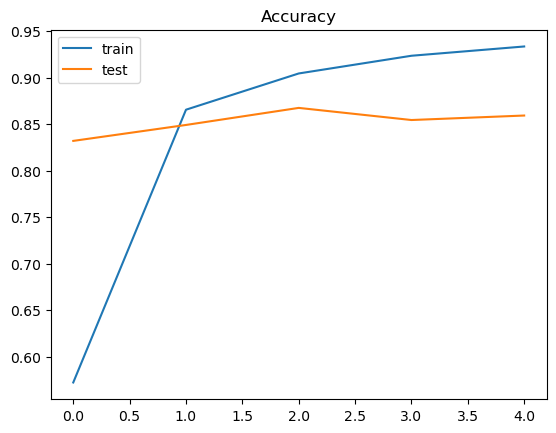

In [41]:
plt.title('Accuracy')
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='test')
plt.legend()
plt.show();

In [112]:
df_data=pd.read_csv('All_Text_Output_final.csv')
df_data.head()

,Text OUTPUT
0,ANI\t @ANI\t Telangana: Hyderabad\t Police ...
1,Whole bollywood; Left ecosystem\t Is after he...
2,Meerut: Man changes identity to trap\t Ghazia...
3,Boss is back in buisness
4,Sharjil Imam tested Positive\t for Coronaviru...


In [115]:
df_data["Text OUTPUT"] = df_data["Text OUTPUT"].apply(clean)
df_data['Text OUTPUT'] = df_data['Text OUTPUT'].str.replace('\t', '')
df_data.head()

,Text OUTPUT
0,ani ani telangana hyderabad polic has arre...
1,whole bollywood left ecosystem attack worst ...
2,meerut man chang ident trap ghaziabad woman c...
3,boss back bui
4,sharjil imam test positive coronavirus varava...


In [102]:
text=['ANI @ANI Telangana: Hyderabad Police has arrested a man for posing as a COVID-19 recovered patient and cheating people in the guise of donating plasma and supplying antivira medicine @ibrollja814.761&arra3cF City']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 422ms/step
[[2.2917842e-02 8.8722533e-01 3.2900865e-03 3.8894750e-03 6.9034837e-02
  3.4120498e-04 4.4681571e-04 1.2529064e-02 3.2543106e-04]] Bjp Negative


In [104]:
text=['U.P Conducted 1.06 Lakh Corona tests in a single dav T itrollpolitics UP is fighting Coronavirus in MoSt organized wav than anv other state Ieea']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Cngress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 74ms/step
[[3.0671186e-03 9.7516441e-01 2.9681684e-03 2.5234808e-04 1.4365320e-02
  2.1463858e-04 1.5174095e-04 3.4953081e-03 3.2105489e-04]] Bjp Negative


In [105]:
text=['clseaideof Rahul Gandhi filed petition tostopBhumiPujan at Ramjanmbhumi @itrolpolitics Allahabad HC dismissed the petition:']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 81ms/step
[[1.1531444e-05 9.8382367e-04 1.0184663e-04 1.9914662e-02 8.9477724e-01
  8.4098041e-02 5.4845394e-05 5.2595416e-05 5.4575921e-06]] Congress Negative


In [106]:
text=['MUwWZw @TimesNowi #Breaking Image of Lord Ram and 3D portraits of the grand Ram Temple in Ayodhya will be beamed across the giant billboards in the iconic Times Square on August 5 to celebrate the temple Bhumi Pujan ceremony:BREAKING NEWS Kbzi']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 84ms/step
[[1.10650547e-02 1.50691392e-02 9.71298635e-01 2.77983036e-05
  3.12977965e-04 1.87349599e-03 2.41898351e-06 2.42438095e-04
  1.08046406e-04]] Bjp Neural


In [107]:
text=['Tweet Abhishek Panchal @ipradhanjii VHP National president Sh. Alok Kumarji said, VHP is going to file a defamation suit against Aam Aadmi Partys Sanjay Singh and they wont accept apology:11.27 PM - 14 Jun 21 Twitter for Android any']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 90ms/step
[[0.20762289 0.1608663  0.18100488 0.18100627 0.07612479 0.17544264
  0.00371817 0.00347989 0.01073412]] Bjp Positive


In [109]:
text=['@itrollpolitics Not Invited till now, Kejiwal @nlaying stone GeremonyofShRam temple Inbackground? Kejriwal komat bulaneab apne aapko KarsevakbolkeSara kha jayega']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 76ms/step
[[3.5087403e-04 7.4233550e-01 2.7687012e-03 4.4297989e-04 2.4958540e-01
  1.3553336e-03 3.8787264e-05 3.0473901e-03 7.5000928e-05]] Bjp Negative


In [43]:
text=['@ipradhanjii Rahul ji ready to compete with Modi ji']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 56ms/step
[[2.78306634e-05 1.38788195e-02 6.74808762e-05 1.13278371e-03
  9.81889844e-01 2.85512791e-03 5.15421489e-05 9.08798684e-05
  5.65854361e-06]] Congress Negative


In [43]:
text=['GANDHL IS JONiNG mAEsH Wth MUSLIM DEFEAT BJP CPM KERALA EVE IeL JEISTTGXHB tFohahtows IS FIGHTING']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neural','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 59ms/step
[[9.9718273e-01 1.9164283e-03 8.7442435e-04 2.1883607e-05 2.4329600e-07
  9.6685689e-08 9.9695922e-07 3.8347738e-07 2.8141890e-06]] Bjp Positive


In [44]:
text=['U N | 0 N MRROR NIOW BUDGET 2023 PMS ADDRESS AFTER BUDGET']
seq = tokenizer.texts_to_sequences(text)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['Bjp Positive', 'Bjp Negative', 'Bjp Neutral','Congress Positive','Congress Negative','Congress Neutral','Other Positive','Other Negative','Other Neutral']
print(pred, labels[np.argmax(pred)])

1/1 [==============================] - 0s 61ms/step
[[7.85161217e-04 8.46298575e-01 1.65313110e-03 2.56685307e-04
  1.23743154e-01 8.55328050e-04 2.59793276e-04 2.56106071e-02
  5.37560845e-04]] Bjp Negative
